# Task5: Homography + RANSAC

In [1]:
import numpy as np
import scipy.linalg as linalg
import cv2
from PIL import Image
from pylab import *
import matplotlib as mpl
import matplotlib.pyplot as plt
import yaml
import cv2

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

First of all, read im01 and im02, then find all the SIFT keypoints and descriptors:

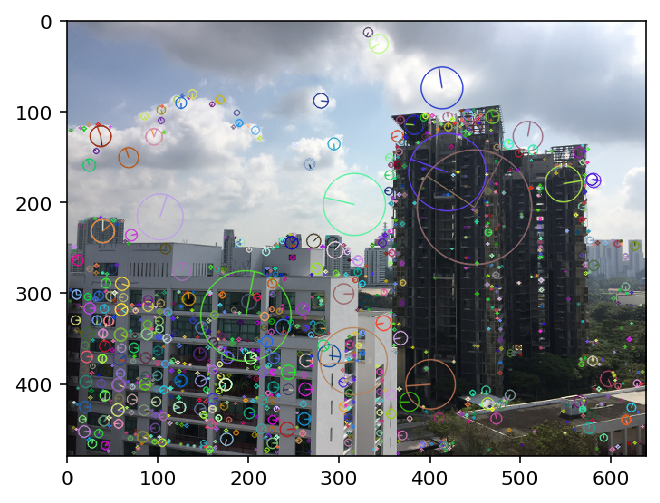

In [2]:
img1 = cv2.imread('im01.jpg')
img2 = cv2.imread('im02.jpg')
siftCreater = cv2.SIFT_create()

kps1, des1 = siftCreater.detectAndCompute(img1, None)
kps2, des2 = siftCreater.detectAndCompute(img2, None)

newImage1 = cv2.drawKeypoints(image=img1, keypoints=kps1, outImage=img1, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
newImage2 = cv2.drawKeypoints(image=img2, keypoints=kps2, outImage=img2, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.imshow(cv2.cvtColor(newImage1,cv2.COLOR_BGR2RGB), interpolation='none')
plt.imshow(cv2.cvtColor(newImage2,cv2.COLOR_BGR2RGB), interpolation='none')
plt.show()

In [3]:
print(kps1[1].pt)

(4.883611679077148, 275.9843444824219)


Secondly, find all the matches based on SIFT keypoints and descriptors. The matches are found based on the 2-norm distance between members of kps1 and kps2.

In [4]:
# for each kp in kp1 of img1, find the match in kps2 of img2:
kpNum1 = des1.shape[0]
kpNum2 = des2.shape[0]
# print(kpNum1, kpNum2)

matches = np.zeros((kpNum1,5))
for i in range(0,kpNum1):
    minDist = np.linalg.norm(des1[i] - des2[0])
    matches[i][0] = kps1[i].pt[0]
    matches[i][1] = kps1[i].pt[1]
    matches[i][2] = kps2[0].pt[0]
    matches[i][3] = kps2[0].pt[1]
    matches[i][4] = minDist
    for j in range(1, kpNum2):
        newDist = np.linalg.norm(des1[i] - des2[j])
        if newDist < minDist:
            minDist = newDist
            matches[i][0] = kps1[i].pt[0]
            matches[i][1] = kps1[i].pt[1]
            matches[i][2] = kps2[j].pt[0]
            matches[i][3] = kps2[j].pt[1]
            matches[i][4] = minDist
print(matches)

[[  4.88361168 275.98434448  10.17795277 301.40032959 369.75396729]
 [  4.88361168 275.98434448  10.17795277 301.40032959 347.13973999]
 [  5.263659   464.07284546 360.88778687 340.03869629 135.13696289]
 ...
 [630.88708496 276.57781982 523.11322021 296.19488525 231.5987854 ]
 [630.88708496 276.57781982 584.45446777 471.37057495 261.6619873 ]
 [630.88708496 276.57781982 478.503479   422.78536987 315.93035889]]


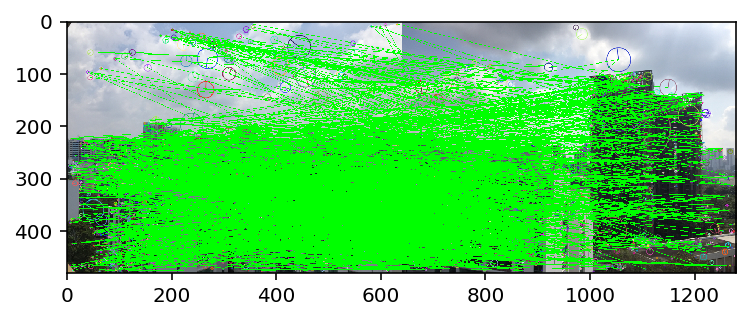

In [5]:
# prepare a new canvas
imgSizeY1 = img1.shape[0]
imgSizeX1 = img1.shape[1]
imgSizeY2 = img2.shape[0]
imgSizeX2 = img2.shape[1]
newImg = np.zeros((max(imgSizeY1, imgSizeY2), (imgSizeX1 + imgSizeX2), 3), dtype="uint8")
# paste the two images on the new canvas
newImg[0:imgSizeY1, 0:imgSizeX1] = img1
newImg[0:imgSizeY2, imgSizeX1:] = img2

# pt1 = (int(matches[0][0]), int(matches[0][1]))
# pt2 = ( (int(matches[0][2]) + imgSizeX1), int(matches[0][3]))
# cv2.line(newImg, pt1, pt2, (0, 255, 0), 1)

for i in range(0, kpNum1):
    pt1 = (int(matches[i][0]), int(matches[i][1]))
    pt2 = ( (int(matches[i][2]) + imgSizeX1), int(matches[i][3]))
    cv2.line(newImg, pt1, pt2, (0, 255, 0), 1)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.imshow(cv2.cvtColor(newImg,cv2.COLOR_BGR2RGB), interpolation='none')
plt.show()

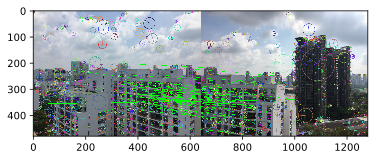

In [6]:
# Set a threshold = 100 to reduce the matches:
thres = 100
# prepare a new canvas
imgSizeY1 = img1.shape[0]
imgSizeX1 = img1.shape[1]
imgSizeY2 = img2.shape[0]
imgSizeX2 = img2.shape[1]
newImg = np.zeros((max(imgSizeY1, imgSizeY2), (imgSizeX1 + imgSizeX2), 3), dtype="uint8")
# paste the two images on the new canvas
newImg[0:imgSizeY1, 0:imgSizeX1] = img1
newImg[0:imgSizeY2, imgSizeX1:] = img2

for i in range(0, kpNum1):
    if(matches[i][4] <= thres):
        pt1 = (int(matches[i][0]), int(matches[i][1]))
        pt2 = ( (int(matches[i][2]) + imgSizeX1), int(matches[i][3]))
        cv2.line(newImg, pt1, pt2, (0, 255, 0), 1)

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.imshow(cv2.cvtColor(newImg,cv2.COLOR_BGR2RGB), interpolation='none')
plt.show()

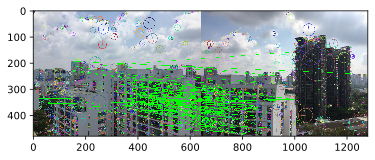

In [7]:
# Set a threshold = 120 to reduce the matches:
thres = 120
# prepare a new canvas
imgSizeY1 = img1.shape[0]
imgSizeX1 = img1.shape[1]
imgSizeY2 = img2.shape[0]
imgSizeX2 = img2.shape[1]
newImg = np.zeros((max(imgSizeY1, imgSizeY2), (imgSizeX1 + imgSizeX2), 3), dtype="uint8")
# paste the two images on the new canvas
newImg[0:imgSizeY1, 0:imgSizeX1] = img1
newImg[0:imgSizeY2, imgSizeX1:] = img2

for i in range(0, kpNum1):
    if(matches[i][4] <= thres):
        pt1 = (int(matches[i][0]), int(matches[i][1]))
        pt2 = ( (int(matches[i][2]) + imgSizeX1), int(matches[i][3]))
        cv2.line(newImg, pt1, pt2, (0, 255, 0), 1)

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.imshow(cv2.cvtColor(newImg,cv2.COLOR_BGR2RGB), interpolation='none')
plt.show()

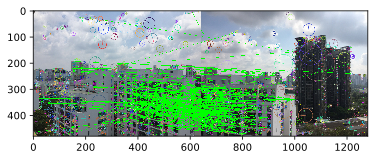

In [8]:
# Set a threshold = 150 to reduce the matches:
thres = 150
# prepare a new canvas
imgSizeY1 = img1.shape[0]
imgSizeX1 = img1.shape[1]
imgSizeY2 = img2.shape[0]
imgSizeX2 = img2.shape[1]
newImg = np.zeros((max(imgSizeY1, imgSizeY2), (imgSizeX1 + imgSizeX2), 3), dtype="uint8")
# paste the two images on the new canvas
newImg[0:imgSizeY1, 0:imgSizeX1] = img1
newImg[0:imgSizeY2, imgSizeX1:] = img2

for i in range(0, kpNum1):
    if(matches[i][4] <= thres):
        pt1 = (int(matches[i][0]), int(matches[i][1]))
        pt2 = ((int(matches[i][2]) + imgSizeX1), int(matches[i][3]))
        cv2.line(newImg, pt1, pt2, (0, 255, 0), 1)

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.imshow(cv2.cvtColor(newImg,cv2.COLOR_BGR2RGB), interpolation='none')
plt.show()

## 2. Ransac
Now use RANSAC to compute the best homography. Two parameters to be set: the number of iterations T, and the parameter for inliner $\epsilon$

In [9]:
# fakeRandomMatches = np.array([[332, 261, 28, 291],[574, 260, 287, 287],[323, 357, 11, 420], [554, 402, 275, 559]])

In [10]:
# imgSizeY1 = img1.shape[0]
# imgSizeX1 = img1.shape[1]
# imgSizeY2 = img2.shape[0]
# imgSizeX2 = img2.shape[1]
# newImg = np.zeros((max(imgSizeY1, imgSizeY2), (imgSizeX1 + imgSizeX2), 3), dtype="uint8")
# # paste the two images on the new canvas
# newImg[0:imgSizeY1, 0:imgSizeX1] = img1
# newImg[0:imgSizeY2, imgSizeX1:] = img2

# for i in range(0, fakeRandomMatches.shape[0]):
#     pt1 = (int(fakeRandomMatches[i][0]), int(fakeRandomMatches[i][1]))
#     pt2 = ( (int(fakeRandomMatches[i][2]) + imgSizeX1), int(fakeRandomMatches[i][3]))
#     cv2.line(newImg, pt1, pt2, (0, 255, 0), 1)

# %matplotlib inline
# %config InlineBackend.figure_format = 'svg'
# plt.imshow(cv2.cvtColor(newImg,cv2.COLOR_BGR2RGB), interpolation='none')
# plt.show()

In [11]:
# reduce the number of matches:
newMatchesSize = int(matches.shape[0]/14)
# print(matches)
# print(matches.shape[0])
# print(newMatchesSize)
matches = matches[np.argsort(matches[:, 4])]
# print(matches)
# print(matches.shape[0])
print(matches)
newMat = matches[0:newMatchesSize,0:5]
print(newMat.shape[0])
print(newMat)

[[424.83786011 432.3989563  139.87136841 468.36398315  32.92415619]
 [411.33859253 346.42944336 129.27708435 377.41860962  42.05948257]
 [345.83486938 245.16345215  54.44433594 268.22677612  42.94182205]
 ...
 [ 85.07196045 406.40997314 221.19197083 458.41522217 410.23651123]
 [212.34368896 307.5128479  629.77630615 430.99835205 423.02008057]
 [106.71111298 307.87957764  87.83556366 345.07830811 428.07357788]]
114
[[424.83786011 432.3989563  139.87136841 468.36398315  32.92415619]
 [411.33859253 346.42944336 129.27708435 377.41860962  42.05948257]
 [345.83486938 245.16345215  54.44433594 268.22677612  42.94182205]
 [443.47366333 371.20095825 163.72183228 400.45596313  60.47313309]
 [409.5065918  319.07626343 129.17277527 348.10858154  61.67657471]
 [398.47485352 299.40701294 116.59263611 327.66140747  63.37980652]
 [617.81835938 224.1502533  310.4196167  251.01387024  63.66317749]
 [487.48648071 338.98431396 210.54902649 363.084198    68.46166992]
 [433.65664673 302.92388916 155.953598

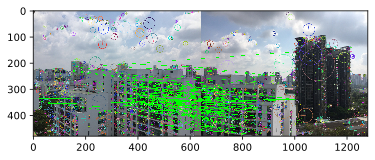

In [12]:
# Testing block
# prepare a new canvas
imgSizeY1 = img1.shape[0]
imgSizeX1 = img1.shape[1]
imgSizeY2 = img2.shape[0]
imgSizeX2 = img2.shape[1]
newImg = np.zeros((max(imgSizeY1, imgSizeY2), (imgSizeX1 + imgSizeX2), 3), dtype="uint8")
# paste the two images on the new canvas
newImg[0:imgSizeY1, 0:imgSizeX1] = img1
newImg[0:imgSizeY2, imgSizeX1:] = img2

for i in range(0, newMat.shape[0]):
    pt1 = (int(newMat[i][0]), int(newMat[i][1]))
    pt2 = ((int(newMat[i][2]) + imgSizeX1), int(newMat[i][3]))
    cv2.line(newImg, pt1, pt2, (0, 255, 0), 1)

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.imshow(cv2.cvtColor(newImg,cv2.COLOR_BGR2RGB), interpolation='none')
plt.show()


Recover this:

In [13]:
import random
# thres = 150
def selectRandomMatches(newMat):
    matchesSize = newMat.shape[0]
    randomMatPoses = random.sample(range(0, matchesSize),4)
    print(randomMatPoses)
    randomMat = []
    for i in randomMatPoses:
        kp1 = np.array([newMat[i][0], newMat[i][1], 1])
        kp2 = np.array([newMat[i][2], newMat[i][3], 1])
#         kp1 = np.array([newMat[i][1], newMat[i][0], 1])
#         kp2 = np.array([newMat[i][3], newMat[i][2], 1])    
        randomMat.append([kp1, kp2])
    
    return randomMat

In [14]:
# import random
# def selectRandomMatches(fakeRandomMatches):
#     matchesSize = fakeRandomMatches.shape[0]
    
#     randomMat = []
# #     fakeRandomMatches = np.array([[28, 291, 332, 261],[287, 287, 574, 260],[11, 420, 323, 357], [275, 559, 554, 402]])
#     fakeRandomMatches = np.array([[332, 261, 28, 291],[574, 260, 287, 287],[323, 357, 11, 420], [554, 402, 275, 559]])
#     for i in range(0,matchesSize):
#         kp1 = np.array([fakeRandomMatches[i][0], fakeRandomMatches[i][1], 1])
#         kp2 = np.array([fakeRandomMatches[i][2], fakeRandomMatches[i][3], 1])
#         randomMat.append([kp1, kp2])
#         print(fakeRandomMatches)
#     return randomMat

In [15]:
# # Testing block:
# fakeRandomMatches = np.array([[332, 261, 28, 291],[574, 260, 287, 287],[323, 357, 11, 420], [554, 402, 275, 559]])
# selectRandomMatches(fakeRandomMatches)

In [16]:
# def getHomography(x1, x2, x3, x4, x5, y1, y2, y3, y4, y5):
# #     print(x1, x2, x3, x4, x5, y1, y2, y3, y4, y5)
#     A = np.array([[x1[0],x1[1],1, 0,0,0, -x1[0]*y1[0],-x1[1]*y1[0],-y1[0]],
#                   [0,0,0, x1[0],x1[1],1, -x1[0]*y1[1],-x1[1]*y1[1],-y1[1]],
#                   [x2[0],x2[1],1, 0,0,0, -x2[0]*y2[0],-x2[1]*y2[0],-y2[0]],
#                   [0,0,0, x2[0],x2[1],1, -x2[0]*y2[1],-x2[1]*y2[1],-y2[1]],
#                   [x3[0],x3[1],1, 0,0,0, -x3[0]*y3[0],-x3[1]*y3[0],-y3[0]],
#                   [0,0,0, x3[0],x3[1],1, -x3[0]*y3[1],-x3[1]*y3[1],-y3[1]],
#                   [x4[0],x4[1],1, 0,0,0, -x4[0]*y4[0],-x4[1]*y4[0],-y4[0]],
#                   [0,0,0, x4[0],x4[1],1, -x4[0]*y4[1],-x4[1]*y4[1],-y4[1]],
#                   [x5[0],x5[1],1, 0,0,0, -x5[0]*y5[0],-x5[1]*y5[0],-y5[0]],
#                   [0,0,0, x5[0],x5[1],1, -x5[0]*y5[1],-x5[1]*y5[1],-y5[1]]])
#     U, D, Vt = linalg.svd(A)
#     H = Vt[-1].reshape(3,3)
    
#     return H

In [17]:
def getHomographyOfRandomSize(points):
    # computes homography matrix of any sizes:
    length = len(points)
    A = np.zeros((length*2, 9))
    
    i=0
    while i < (length):
        j = i*2
        A[j][0:3] = np.array([points[i][0]])
        A[j][6:9] = np.array([-points[i][0][0]*points[i][1][0], -points[i][0][1]*points[i][1][0], -points[i][1][0]])
        A[j+1][3:6] = np.array([points[i][0]])
        A[j+1][6:9] = np.array([-points[i][0][0]*points[i][1][1], -points[i][0][1]*points[i][1][1], -points[i][1][1]])
        i+=1
    print(A)
    U, D, Vt = linalg.svd(A)
    H = Vt[-1].reshape(3,3)
#     print(H)
    
    return H

In [18]:
# testing block
points = []
points.append([np.array([93,63,1]), np.array([-7,0,1])])
points.append([np.array([293,868,1]), np.array([3,-6,1])])
points.append([np.array([1207,998,1]), np.array([7,-4,1])])
points.append([np.array([1218,309,1]), np.array([3,2,1])])

print(points)
getHomographyOfRandomSize(points)

[[array([93, 63,  1]), array([-7,  0,  1])], [array([293, 868,   1]), array([ 3, -6,  1])], [array([1207,  998,    1]), array([ 7, -4,  1])], [array([1218,  309,    1]), array([3, 2, 1])]]
[[ 9.300e+01  6.300e+01  1.000e+00  0.000e+00  0.000e+00  0.000e+00
   6.510e+02  4.410e+02  7.000e+00]
 [ 0.000e+00  0.000e+00  0.000e+00  9.300e+01  6.300e+01  1.000e+00
   0.000e+00  0.000e+00  0.000e+00]
 [ 2.930e+02  8.680e+02  1.000e+00  0.000e+00  0.000e+00  0.000e+00
  -8.790e+02 -2.604e+03 -3.000e+00]
 [ 0.000e+00  0.000e+00  0.000e+00  2.930e+02  8.680e+02  1.000e+00
   1.758e+03  5.208e+03  6.000e+00]
 [ 1.207e+03  9.980e+02  1.000e+00  0.000e+00  0.000e+00  0.000e+00
  -8.449e+03 -6.986e+03 -7.000e+00]
 [ 0.000e+00  0.000e+00  0.000e+00  1.207e+03  9.980e+02  1.000e+00
   4.828e+03  3.992e+03  4.000e+00]
 [ 1.218e+03  3.090e+02  1.000e+00  0.000e+00  0.000e+00  0.000e+00
  -3.654e+03 -9.270e+02 -3.000e+00]
 [ 0.000e+00  0.000e+00  0.000e+00  1.218e+03  3.090e+02  1.000e+00
  -2.436e+03 -6

array([[ 7.66575414e-04,  1.58444870e-03, -9.92728904e-01],
       [ 6.18613947e-04, -1.66221257e-03,  4.71882946e-02],
       [ 1.53502369e-07,  1.05575751e-04,  1.10708327e-01]])

In [19]:
def getRandomHomography(mat):
    # select 5 random matching points and computes the random homography
    # 1. select 5 random rows from the matching arry:
    randomMat = selectRandomMatches(mat)
    # 2. computes homography based on the 5 points and return:
    return getHomographyOfRandomSize(randomMat)    

In [20]:
# def getRandomHomography():
#     fakeRandomMatches = np.array([[332, 261, 28, 291],[574, 260, 287, 287],[323, 357, 11, 420], [554, 402, 275, 559]])
#     # select 5 random matching points and computes the random homography
#     # 1. select 5 random rows from the matching arry:
#     randomMat = selectRandomMatches(fakeRandomMatches)
#     # 2. computes homography based on the 5 points and return:
#     return getHomographyOfRandomSize(randomMat)

In [21]:
# # testing block:
# getRandomHomography(newMat)

In [36]:
# Set epsilon to be 50
def getInliners(H):
    # 1. count the inliners w.r.t. epsilon = 50:
    epsilon = 50
    # 2. initialize the list of inliners and error
    inliners = []
    totalErr = 0
    # 3. loop to search if there is a inliner in the matching pairs
    newMatSize = newMat.shape[0]
    for i in range(0, newMatSize):
        # 3.1.i get the kp1 in img1 and transforms:
        coord1 = np.array([newMat[i][0], newMat[i][1], 1])
#         coord1 = np.array([newMat[i][1], newMat[i][0], 1])
        transCoord1 = H.dot(coord1) # transforms by H
        transCoord1 = transCoord1/transCoord1[2] # normalization
        # 3.2. get the matching kp2 in img2 of that in img1
        coord2 = np.array([newMat[i][2], newMat[i][3], 1])
#         coord2 = np.array([newMat[i][3], newMat[i][2], 1])
        # 3.3. work out the distance between kp2 and H*kp1
        dist = np.linalg.norm(transCoord1 - coord2)
        # 3.4 updates the inliner list if the current pair is close enough: dist < epsilon
        if dist < epsilon:
            inliners.append([coord1, coord2])
            totalErr+=dist # work out the total error of the current list of inliners
    # 4. returns the inliners and the corresponding error:
    return inliners, totalErr

In [37]:
def ransac():
    # define the number of iterations:
    T = 7000
    # define the maximum set of inliners and best(smallest error)
    maxInliners = []
    maxInlinersNum = 0
    bestErr = 0
    # loop for T interations to find the best homography that most points agrees
    superH = np.zeros((3,3))
    for i in range(0, T):
        print(i)
        # select a random homography:
        H = getRandomHomography(newMat)
        # count the inliners:
        inliners, err = getInliners(H)
        # update the best set of inliners and errors
        if (i == 0):
            superH = H
            bestErr = err
            maxInliners = inliners
        if (maxInlinersNum < len(inliners)) or (bestErr > err):
            superH = H
            maxInliners = inliners
            maxInlinersNum = len(inliners)
    # recompute the homography on all the inliners from the maximum inliners-set
    maxInlinersArr = np.zeros((maxInlinersNum, 4))
    for i in range(0, maxInlinersNum):
        maxInlinersArr[i,0:2] = np.array([maxInliners[i][0][0], maxInliners[i][0][1]])
        maxInlinersArr[i,2:4] = np.array([maxInliners[i][1][0], maxInliners[i][1][1]])
    
#     superH = getRandomHomography(maxInlinersArr)
    print(maxInliners)
    return maxInliners, superH

In [38]:
# # testing block:
# ransac()

0
[85, 19, 80, 25]
[[ 2.31078243e+01  3.36087372e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.33933158e+03 -1.21289828e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.31078243e+01
   3.36087372e+02  1.00000000e+00 -7.85755446e+03 -1.14282712e+05
  -3.40038696e+02]
 [ 4.79540100e+02  3.46510010e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.69729801e+04 -7.00715295e+04
  -2.02220795e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.79540100e+02
   3.46510010e+02  1.00000000e+00 -1.78085546e+05 -1.28682511e+05
  -3.71367371e+02]
 [ 3.60608246e+02  3.59515411e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.36577602e+04 -2.35860646e+04
  -6.56051559e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.60608246e+02
   3.59515411e+02  1.00000000e+00 -1.53642520e+05 -1.53176902e+05
  -4.26064911e+02]
 [ 3.45870239e+02  3.19245972e+02  1.00000000e+00  0.00000000e+00
   0.0000

110
[86, 36, 67, 12]
[[ 1.52562973e+02  3.69072174e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.50581137e+04 -1.33193640e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.52562973e+02
   3.69072174e+02  1.00000000e+00 -5.18773144e+04 -1.25498821e+05
  -3.40038696e+02]
 [ 4.54576080e+02  3.43367798e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.02803651e+04 -6.06404370e+04
  -1.76604904e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.54576080e+02
   3.43367798e+02  1.00000000e+00 -1.68587741e+05 -1.27344143e+05
  -3.70868042e+02]
 [ 4.14367706e+02  3.81845459e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.33943543e+04 -4.92036214e+04
  -1.28857422e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.14367706e+02
   3.81845459e+02  1.00000000e+00 -1.59952877e+05 -1.47398745e+05
  -3.86016754e+02]
 [ 4.32941071e+02  2.74925201e+02  1.00000000e+00  0.00000000e+00
   0.00

188
[79, 96, 35, 84]
[[ 1.47343414e+02  2.11661926e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.31744387e+04 -7.63862041e+04
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.47343414e+02
   2.11661926e+02  1.00000000e+00 -5.01024625e+04 -7.19732455e+04
  -3.40038696e+02]
 [ 4.49550964e+02  3.24024139e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.55769024e+04 -4.72660523e+04
  -1.45872009e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.49550964e+02
   3.24024139e+02  1.00000000e+00 -1.87835572e+05 -1.35386784e+05
  -4.17829315e+02]
 [ 6.17818359e+02  2.24150253e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.91782938e+05 -6.95806357e+04
  -3.10419617e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  6.17818359e+02
   2.24150253e+02  1.00000000e+00 -1.55080977e+05 -5.62648226e+04
  -2.51013870e+02]
 [ 4.85976257e+02  3.26996582e+02  1.00000000e+00  0.00000000e+00
   0.00

[[ 4.44138458e+02  3.16278137e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.41902676e+04 -5.28320824e+04
  -1.67043106e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.44138458e+02
   3.16278137e+02  1.00000000e+00 -1.52097714e+05 -1.08311228e+05
  -3.42455627e+02]
 [ 3.39273743e+02  2.94555634e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.45221804e+04 -1.26080787e+04
  -4.28037262e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.39273743e+02
   2.94555634e+02  1.00000000e+00 -1.10133105e+05 -9.56169674e+04
  -3.24614288e+02]
 [ 4.23829926e+02  3.20320435e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.47472877e+04 -4.13766795e+04
  -1.29172775e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.23829926e+02
   3.20320435e+02  1.00000000e+00 -1.47538834e+05 -1.11506292e+05
  -3.48108582e+02]
 [ 3.75150696e+02  3.30076508e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

[[ 3.98817871e+02  2.90714020e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.65248425e+04 -4.84925721e+04
  -1.66805069e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.98817871e+02
   2.90714020e+02  1.00000000e+00 -1.39641414e+05 -1.01790114e+05
  -3.50138306e+02]
 [ 3.85992889e+02  3.44021729e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.79867043e+04 -3.38561979e+04
  -9.84129639e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.85992889e+02
   3.44021729e+02  1.00000000e+00 -1.56605789e+05 -1.39577168e+05
  -4.05721954e+02]
 [ 2.31078243e+01  3.36087372e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.33933158e+03 -1.21289828e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.31078243e+01
   3.36087372e+02  1.00000000e+00 -7.85755446e+03 -1.14282712e+05
  -3.40038696e+02]
 [ 3.39273743e+02  2.94555634e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

532
[27, 14, 79, 6]
[[ 4.98399384e+02  2.47995834e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.09969996e+05 -5.47193711e+04
  -2.20646332e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.98399384e+02
   2.47995834e+02  1.00000000e+00 -1.35790089e+05 -6.75670508e+04
  -2.72452362e+02]
 [ 3.45966187e+02  2.70910797e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.75049211e+04 -1.37073284e+04
  -5.05972023e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45966187e+02
   2.70910797e+02  1.00000000e+00 -1.21966289e+05 -9.55063987e+04
  -3.52538177e+02]
 [ 1.47343414e+02  2.11661926e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.31744387e+04 -7.63862041e+04
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.47343414e+02
   2.11661926e+02  1.00000000e+00 -5.01024625e+04 -7.19732455e+04
  -3.40038696e+02]
 [ 6.17818359e+02  2.24150253e+02  1.00000000e+00  0.00000000e+00
   0.000

  -3.91171722e+02]]
576
[3, 35, 43, 104]
[[ 4.43473663e+02  3.71200958e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.26063207e+04 -6.07737010e+04
  -1.63721832e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.43473663e+02
   3.71200958e+02  1.00000000e+00 -1.77591673e+05 -1.48649637e+05
  -4.00455963e+02]
 [ 6.17818359e+02  2.24150253e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.91782938e+05 -6.95806357e+04
  -3.10419617e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  6.17818359e+02
   2.24150253e+02  1.00000000e+00 -1.55080977e+05 -5.62648226e+04
  -2.51013870e+02]
 [ 3.39273743e+02  2.94555634e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.45221804e+04 -1.26080787e+04
  -4.28037262e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.39273743e+02
   2.94555634e+02  1.00000000e+00 -1.10133105e+05 -9.56169674e+04
  -3.24614288e+02]
 [ 3.63904877e+02  3.39934509e+02  1.00000000e+00  0.

624
[22, 35, 40, 96]
[[ 4.18068512e+02  3.19704712e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.75527296e+04 -5.93060046e+04
  -1.85502441e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.18068512e+02
   3.19704712e+02  1.00000000e+00 -1.76178062e+05 -1.34726617e+05
  -4.21409546e+02]
 [ 6.17818359e+02  2.24150253e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.91782938e+05 -6.95806357e+04
  -3.10419617e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  6.17818359e+02
   2.24150253e+02  1.00000000e+00 -1.55080977e+05 -5.62648226e+04
  -2.51013870e+02]
 [ 4.85391113e+02  3.08185425e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.01881985e+05 -6.46870983e+04
  -2.09896683e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.85391113e+02
   3.08185425e+02  1.00000000e+00 -1.61329294e+05 -1.02431494e+05
  -3.32369690e+02]
 [ 4.49550964e+02  3.24024139e+02  1.00000000e+00  0.00000000e+00
   0.00

715
[42, 14, 65, 26]
[[ 3.75139130e+02  2.79709442e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.34767082e+04 -2.49607429e+04
  -8.92381134e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.75139130e+02
   2.79709442e+02  1.00000000e+00 -1.15308081e+05 -8.59754593e+04
  -3.07374176e+02]
 [ 3.45966187e+02  2.70910797e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.75049211e+04 -1.37073284e+04
  -5.05972023e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45966187e+02
   2.70910797e+02  1.00000000e+00 -1.21966289e+05 -9.55063987e+04
  -3.52538177e+02]
 [ 3.98671387e+02  3.51655029e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.51052577e+04 -3.97858769e+04
  -1.13138939e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.98671387e+02
   3.51655029e+02  1.00000000e+00 -1.76711348e+05 -1.55871317e+05
  -4.43250641e+02]
 [ 4.73301544e+02  3.38910370e+02  1.00000000e+00  0.00000000e+00
   0.00

808
[31, 46, 16, 81]
[[ 4.46864685e+02  3.20363800e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.57923308e+04 -5.43366257e+04
  -1.69609131e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.46864685e+02
   3.20363800e+02  1.00000000e+00 -1.54965030e+05 -1.11096687e+05
  -3.46782898e+02]
 [ 3.85992889e+02  3.44021729e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.75188375e+04 -3.34392049e+04
  -9.72008514e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.85992889e+02
   3.44021729e+02  1.00000000e+00 -1.67767354e+05 -1.49525074e+05
  -4.34638458e+02]
 [ 4.07793884e+02  3.81142822e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.01124959e+04 -4.68374315e+04
  -1.22886826e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.07793884e+02
   3.81142822e+02  1.00000000e+00 -1.69356658e+05 -1.58288481e+05
  -4.15299652e+02]
 [ 1.47129105e+02  2.32071594e+02  1.00000000e+00  0.00000000e+00
   0.00

  -2.77304993e+02]]
909
[6, 85, 111, 94]
[[ 6.17818359e+02  2.24150253e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.91782938e+05 -6.95806357e+04
  -3.10419617e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  6.17818359e+02
   2.24150253e+02  1.00000000e+00 -1.55080977e+05 -5.62648226e+04
  -2.51013870e+02]
 [ 2.31078243e+01  3.36087372e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.33933158e+03 -1.21289828e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.31078243e+01
   3.36087372e+02  1.00000000e+00 -7.85755446e+03 -1.14282712e+05
  -3.40038696e+02]
 [ 5.52040833e+02  3.61976440e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.29359047e+05 -8.48214926e+04
  -2.34328766e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.52040833e+02
   3.61976440e+02  1.00000000e+00 -2.08333434e+05 -1.36605466e+05
  -3.77387726e+02]
 [ 5.52173828e+02  2.96065186e+02  1.00000000e+00  0.

976
[106, 40, 49, 71]
[[ 2.37549118e+02  2.71507172e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.01877790e+04 -6.87917252e+04
  -2.53369827e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.37549118e+02
   2.71507172e+02  1.00000000e+00 -1.06337745e+05 -1.21538908e+05
  -4.47645294e+02]
 [ 4.85391113e+02  3.08185425e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.01881985e+05 -6.46870983e+04
  -2.09896683e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.85391113e+02
   3.08185425e+02  1.00000000e+00 -1.61329294e+05 -1.02431494e+05
  -3.32369690e+02]
 [ 2.35655231e+01  3.57434601e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.50450950e+03 -1.28993782e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.35655231e+01
   3.57434601e+02  1.00000000e+00 -8.01318977e+03 -1.21541596e+05
  -3.40038696e+02]
 [ 4.26032013e+02  3.10227875e+02  1.00000000e+00  0.00000000e+00
   0.0

1065
[18, 6, 109, 59]
[[ 4.44104156e+02  3.23410614e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.40788245e+04 -5.39465298e+04
  -1.66805069e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.44104156e+02
   3.23410614e+02  1.00000000e+00 -1.55497877e+05 -1.13238444e+05
  -3.50138306e+02]
 [ 6.17818359e+02  2.24150253e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.91782938e+05 -6.95806357e+04
  -3.10419617e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  6.17818359e+02
   2.24150253e+02  1.00000000e+00 -1.55080977e+05 -5.62648226e+04
  -2.51013870e+02]
 [ 3.37814575e+02  2.63680969e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.43359429e+04 -1.11899118e+04
  -4.24373131e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.37814575e+02
   2.63680969e+02  1.00000000e+00 -9.76146906e+04 -7.61930897e+04
  -2.88959381e+02]
 [ 5.06342133e+02  3.48488892e+02  1.00000000e+00  0.00000000e+00
   0.0

[[ 5.06342133e+02  3.48488892e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.15524319e+05 -7.95093657e+04
  -2.28154663e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.06342133e+02
   3.48488892e+02  1.00000000e+00 -1.88103166e+05 -1.29461603e+05
  -3.71494202e+02]
 [ 4.14367706e+02  3.81845459e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.33943543e+04 -4.92036214e+04
  -1.28857422e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.14367706e+02
   3.81845459e+02  1.00000000e+00 -1.59952877e+05 -1.47398745e+05
  -3.86016754e+02]
 [ 4.57079010e+02  3.92058319e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.05292856e+04 -6.90737830e+04
  -1.76182419e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.57079010e+02
   3.92058319e+02  1.00000000e+00 -1.92135857e+05 -1.64804026e+05
  -4.20355896e+02]
 [ 3.75663757e+02  3.55364563e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

1243
[11, 34, 79, 10]
[[ 4.23829926e+02  3.20320435e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.47472877e+04 -4.13766795e+04
  -1.29172775e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.23829926e+02
   3.20320435e+02  1.00000000e+00 -1.47538834e+05 -1.11506292e+05
  -3.48108582e+02]
 [ 3.75139130e+02  2.79709442e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.34767082e+04 -2.49607429e+04
  -8.92381134e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.75139130e+02
   2.79709442e+02  1.00000000e+00 -1.15308081e+05 -8.59754593e+04
  -3.07374176e+02]
 [ 1.47343414e+02  2.11661926e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.31744387e+04 -7.63862041e+04
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.47343414e+02
   2.11661926e+02  1.00000000e+00 -5.01024625e+04 -7.19732455e+04
  -3.40038696e+02]
 [ 3.85826355e+02  2.92363678e+02  1.00000000e+00  0.00000000e+00
   0.0

1306
[51, 110, 71, 0]
[[ 4.99350555e+02  3.40695160e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.10915072e+05 -7.56747498e+04
  -2.22118652e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.99350555e+02
   3.40695160e+02  1.00000000e+00 -1.81919451e+05 -1.24119370e+05
  -3.64312103e+02]
 [ 4.96778168e+02  3.29792053e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.09392006e+05 -7.26211753e+04
  -2.20202927e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.96778168e+02
   3.29792053e+02  1.00000000e+00 -1.75517542e+05 -1.16519393e+05
  -3.53311707e+02]
 [ 4.26032013e+02  3.10227875e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.31020265e+04 -4.59496164e+04
  -1.48115692e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.26032013e+02
   3.10227875e+02  1.00000000e+00 -1.43984090e+05 -1.04846295e+05
  -3.37965424e+02]
 [ 4.24837860e+02  4.32398956e+02  1.00000000e+00  0.00000000e+00
   0.0

1414
[92, 41, 106, 64]
[[ 2.64310474e+01  3.46411621e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.13081406e+03 -8.03519135e+04
  -2.31955017e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.64310474e+01
   3.46411621e+02  1.00000000e+00 -1.24042362e+04 -1.62572883e+05
  -4.69305511e+02]
 [ 4.86817993e+02  3.69964203e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.00563311e+05 -7.64245073e+04
  -2.06572708e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.86817993e+02
   3.69964203e+02  1.00000000e+00 -2.22148876e+05 -1.68825173e+05
  -4.56328400e+02]
 [ 2.37549118e+02  2.71507172e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.01877790e+04 -6.87917252e+04
  -2.53369827e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.37549118e+02
   2.71507172e+02  1.00000000e+00 -1.06337745e+05 -1.21538908e+05
  -4.47645294e+02]
 [ 4.86603363e+02  3.57231659e+02  1.00000000e+00  0.00000000e+00
   0.

[[ 3.86417480e+02  3.10708405e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.92167192e+04 -3.15331600e+04
  -1.01487953e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.86417480e+02
   3.10708405e+02  1.00000000e+00 -1.31202025e+05 -1.05496190e+05
  -3.39534393e+02]
 [ 4.30757599e+02  3.78446533e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.34107839e+04 -5.57101985e+04
  -1.47207581e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.30757599e+02
   3.78446533e+02  1.00000000e+00 -2.02196260e+05 -1.77641611e+05
  -4.69396851e+02]
 [ 3.92956268e+02  3.45019836e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.24528400e+04 -3.72740508e+04
  -1.08034515e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.92956268e+02
   3.45019836e+02  1.00000000e+00 -1.48537481e+05 -1.30417509e+05
  -3.78000031e+02]
 [ 4.12177032e+02  3.28006836e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

[[ 3.45871063e+02  2.80367188e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.60727198e+04 -1.30287373e+04
  -4.64702644e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45871063e+02
   2.80367188e+02  1.00000000e+00 -1.54299522e+05 -1.25077023e+05
  -4.46118622e+02]
 [ 4.26032013e+02  3.10227875e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.31020265e+04 -4.59496164e+04
  -1.48115692e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.26032013e+02
   3.10227875e+02  1.00000000e+00 -1.43984090e+05 -1.04846295e+05
  -3.37965424e+02]
 [ 4.54576080e+02  3.43367798e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.02803651e+04 -6.06404370e+04
  -1.76604904e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.54576080e+02
   3.43367798e+02  1.00000000e+00 -1.68587741e+05 -1.27344143e+05
  -3.70868042e+02]
 [ 3.92956268e+02  3.45019836e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

1727
[109, 47, 54, 63]
[[ 3.37814575e+02  2.63680969e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.43359429e+04 -1.11899118e+04
  -4.24373131e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.37814575e+02
   2.63680969e+02  1.00000000e+00 -9.76146906e+04 -7.61930897e+04
  -2.88959381e+02]
 [ 4.54576080e+02  3.43367798e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.02803651e+04 -6.06404370e+04
  -1.76604904e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.54576080e+02
   3.43367798e+02  1.00000000e+00 -1.68587741e+05 -1.27344143e+05
  -3.70868042e+02]
 [ 3.82202545e+02  2.87394287e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.73092313e+04 -2.80543918e+04
  -9.76163864e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.82202545e+02
   2.87394287e+02  1.00000000e+00 -1.20375606e+05 -9.05155183e+04
  -3.14952393e+02]
 [ 4.13647247e+02  4.36929382e+02  1.00000000e+00  0.00000000e+00
   0.

1826
[75, 63, 49, 92]
[[ 3.75150696e+02  3.30076508e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.23279855e+04 -2.84437925e+04
  -8.61733322e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.75150696e+02
   3.30076508e+02  1.00000000e+00 -1.46748344e+05 -1.29116596e+05
  -3.91171722e+02]
 [ 4.13647247e+02  4.36929382e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.43338056e+04 -5.73919838e+04
  -1.31352997e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.13647247e+02
   4.36929382e+02  1.00000000e+00 -1.84525351e+05 -1.94911360e+05
  -4.46093506e+02]
 [ 2.35655231e+01  3.57434601e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.50450950e+03 -1.28993782e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.35655231e+01
   3.57434601e+02  1.00000000e+00 -8.01318977e+03 -1.21541596e+05
  -3.40038696e+02]
 [ 2.64310474e+01  3.46411621e+02  1.00000000e+00  0.00000000e+00
   0.0

1914
[28, 84, 99, 51]
[[ 3.93086090e+02  2.92825378e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.35584565e+04 -3.24484173e+04
  -1.10811493e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.93086090e+02
   2.92825378e+02  1.00000000e+00 -1.26039478e+05 -9.38917928e+04
  -3.20640900e+02]
 [ 4.85976257e+02  3.26996582e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.01635339e+05 -6.83868974e+04
  -2.09136429e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.85976257e+02
   3.26996582e+02  1.00000000e+00 -1.70567181e+05 -1.14768745e+05
  -3.50978424e+02]
 [ 4.07014160e+02  3.53660431e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.13151895e+04 -6.19667892e+04
  -1.75215500e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.07014160e+02
   3.53660431e+02  1.00000000e+00 -1.83604413e+05 -1.59536503e+05
  -4.51100800e+02]
 [ 4.99350555e+02  3.40695160e+02  1.00000000e+00  0.00000000e+00
   0.0

1967
[29, 7, 45, 46]
[[ 3.37349426e+02  3.35310730e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.25674681e+04 -1.24915194e+04
  -3.72535629e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.37349426e+02
   3.35310730e+02  1.00000000e+00 -1.34756374e+05 -1.33942004e+05
  -3.99456360e+02]
 [ 4.87486481e+02  3.38984314e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.02639804e+05 -7.13728173e+04
  -2.10549026e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.87486481e+02
   3.38984314e+02  1.00000000e+00 -1.76998638e+05 -1.23079848e+05
  -3.63084198e+02]
 [ 4.44138458e+02  3.16278137e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.41902676e+04 -5.28320824e+04
  -1.67043106e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.44138458e+02
   3.16278137e+02  1.00000000e+00 -1.52097714e+05 -1.08311228e+05
  -3.42455627e+02]
 [ 3.85992889e+02  3.44021729e+02  1.00000000e+00  0.00000000e+00
   0.00

[[ 3.66513580e+02  2.17679672e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.58533034e+04 -1.53547888e+04
  -7.05384598e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.66513580e+02
   2.17679672e+02  1.00000000e+00 -8.64732968e+04 -5.13582031e+04
  -2.35934769e+02]
 [ 3.82202545e+02  2.87394287e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.73092313e+04 -2.80543918e+04
  -9.76163864e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.82202545e+02
   2.87394287e+02  1.00000000e+00 -1.20375606e+05 -9.05155183e+04
  -3.14952393e+02]
 [ 4.14367706e+02  3.81845459e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.33943543e+04 -4.92036214e+04
  -1.28857422e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.14367706e+02
   3.81845459e+02  1.00000000e+00 -1.59952877e+05 -1.47398745e+05
  -3.86016754e+02]
 [ 3.98817871e+02  2.90714020e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

2161
[47, 15, 21, 40]
[[ 4.54576080e+02  3.43367798e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.02803651e+04 -6.06404370e+04
  -1.76604904e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.54576080e+02
   3.43367798e+02  1.00000000e+00 -1.68587741e+05 -1.27344143e+05
  -3.70868042e+02]
 [ 4.12177032e+02  3.28006836e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.31120698e+04 -4.22661152e+04
  -1.28857422e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.12177032e+02
   3.28006836e+02  1.00000000e+00 -1.59107240e+05 -1.26616134e+05
  -3.86016754e+02]
 [ 5.15520081e+02  2.94219910e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.22396861e+05 -6.98548801e+04
  -2.37424042e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.15520081e+02
   2.94219910e+02  1.00000000e+00 -1.63523841e+05 -9.33270528e+04
  -3.17201691e+02]
 [ 4.85391113e+02  3.08185425e+02  1.00000000e+00  0.00000000e+00
   0.0

[[ 2.35655231e+01  3.57434601e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.50450950e+03 -1.28993782e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.35655231e+01
   3.57434601e+02  1.00000000e+00 -8.01318977e+03 -1.21541596e+05
  -3.40038696e+02]
 [ 3.66513580e+02  2.17679672e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.58533034e+04 -1.53547888e+04
  -7.05384598e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.66513580e+02
   2.17679672e+02  1.00000000e+00 -8.64732968e+04 -5.13582031e+04
  -2.35934769e+02]
 [ 4.73301544e+02  3.38910370e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.27990312e+04 -6.64492951e+04
  -1.96067459e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.73301544e+02
   3.38910370e+02  1.00000000e+00 -1.72347569e+05 -1.23410496e+05
  -3.64139038e+02]
 [ 1.47129105e+02  2.32071594e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

2332
[16, 33, 83, 18]
[[ 4.07793884e+02  3.81142822e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.01124959e+04 -4.68374315e+04
  -1.22886826e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.07793884e+02
   3.81142822e+02  1.00000000e+00 -1.69356658e+05 -1.58288481e+05
  -4.15299652e+02]
 [ 1.47211166e+02  2.28376007e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.31267120e+04 -8.24181118e+04
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.47211166e+02
   2.28376007e+02  1.00000000e+00 -5.00574931e+04 -7.76566797e+04
  -3.40038696e+02]
 [ 3.29890503e+02  2.78671356e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.37849002e+03 -7.07763684e+03
  -2.53977909e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.29890503e+02
   2.78671356e+02  1.00000000e+00 -1.36915462e+05 -1.15657823e+05
  -4.15033051e+02]
 [ 4.44104156e+02  3.23410614e+02  1.00000000e+00  0.00000000e+00
   0.0

2424
[49, 14, 105, 18]
[[ 2.35655231e+01  3.57434601e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.50450950e+03 -1.28993782e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.35655231e+01
   3.57434601e+02  1.00000000e+00 -8.01318977e+03 -1.21541596e+05
  -3.40038696e+02]
 [ 3.45966187e+02  2.70910797e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.75049211e+04 -1.37073284e+04
  -5.05972023e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45966187e+02
   2.70910797e+02  1.00000000e+00 -1.21966289e+05 -9.55063987e+04
  -3.52538177e+02]
 [ 5.49820801e+02  2.10128159e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.70675162e+05 -6.52279024e+04
  -3.10419617e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.49820801e+02
   2.10128159e+02  1.00000000e+00 -1.38012647e+05 -5.27450823e+04
  -2.51013870e+02]
 [ 4.44104156e+02  3.23410614e+02  1.00000000e+00  0.00000000e+00
   0.

2508
[37, 62, 34, 63]
[[ 3.53451874e+02  3.26166412e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.11404600e+04 -1.95084777e+04
  -5.98114243e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.53451874e+02
   3.26166412e+02  1.00000000e+00 -1.27364228e+05 -1.17532078e+05
  -3.60343903e+02]
 [ 3.45069763e+02  2.72484161e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.80043108e+04 -1.42170948e+04
  -5.21758575e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45069763e+02
   2.72484161e+02  1.00000000e+00 -1.03299658e+05 -8.15705219e+04
  -2.99358765e+02]
 [ 3.75139130e+02  2.79709442e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.34767082e+04 -2.49607429e+04
  -8.92381134e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.75139130e+02
   2.79709442e+02  1.00000000e+00 -1.15308081e+05 -8.59754593e+04
  -3.07374176e+02]
 [ 4.13647247e+02  4.36929382e+02  1.00000000e+00  0.00000000e+00
   0.0

[[ 4.86206635e+02  2.96768372e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.56374485e+04 -4.61672072e+04
  -1.55566467e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.86206635e+02
   2.96768372e+02  1.00000000e+00 -1.84322021e+05 -1.12505553e+05
  -3.79102234e+02]
 [ 2.35655231e+01  3.57434601e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.50450950e+03 -1.28993782e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.35655231e+01
   3.57434601e+02  1.00000000e+00 -8.01318977e+03 -1.21541596e+05
  -3.40038696e+02]
 [ 3.46013794e+02  3.52153534e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.60793525e+04 -1.63646678e+04
  -4.64702644e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.46013794e+02
   3.52153534e+02  1.00000000e+00 -1.54363197e+05 -1.57102249e+05
  -4.46118622e+02]
 [ 4.44104156e+02  3.23410614e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

2620
[68, 44, 16, 99]
[[ 5.06980469e+02  3.80660828e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.15294063e+05 -8.65673058e+04
  -2.27413223e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.06980469e+02
   3.80660828e+02  1.00000000e+00 -2.04536960e+05 -1.53574374e+05
  -4.03441498e+02]
 [ 4.34422516e+02  3.31202576e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.74067160e+04 -5.13907018e+04
  -1.55163956e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.34422516e+02
   3.31202576e+02  1.00000000e+00 -1.56200999e+05 -1.19087228e+05
  -3.59560089e+02]
 [ 4.07793884e+02  3.81142822e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.01124959e+04 -4.68374315e+04
  -1.22886826e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.07793884e+02
   3.81142822e+02  1.00000000e+00 -1.69356658e+05 -1.58288481e+05
  -4.15299652e+02]
 [ 4.07014160e+02  3.53660431e+02  1.00000000e+00  0.00000000e+00
   0.0

2700
[68, 59, 61, 97]
[[ 5.06980469e+02  3.80660828e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.15294063e+05 -8.65673058e+04
  -2.27413223e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.06980469e+02
   3.80660828e+02  1.00000000e+00 -2.04536960e+05 -1.53574374e+05
  -4.03441498e+02]
 [ 5.06342133e+02  3.48488892e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.15524319e+05 -7.95093657e+04
  -2.28154663e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.06342133e+02
   3.48488892e+02  1.00000000e+00 -1.88103166e+05 -1.29461603e+05
  -3.71494202e+02]
 [ 4.90381836e+02  4.47727692e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.02018151e+05 -9.31444598e+04
  -2.08038193e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.90381836e+02
   4.47727692e+02  1.00000000e+00 -2.31602756e+05 -2.11457602e+05
  -4.72290649e+02]
 [ 4.57079010e+02  3.92058319e+02  1.00000000e+00  0.00000000e+00
   0.0

2777
[15, 34, 53, 26]
[[ 4.12177032e+02  3.28006836e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.31120698e+04 -4.22661152e+04
  -1.28857422e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.12177032e+02
   3.28006836e+02  1.00000000e+00 -1.59107240e+05 -1.26616134e+05
  -3.86016754e+02]
 [ 3.75139130e+02  2.79709442e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.34767082e+04 -2.49607429e+04
  -8.92381134e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.75139130e+02
   2.79709442e+02  1.00000000e+00 -1.15308081e+05 -8.59754593e+04
  -3.07374176e+02]
 [ 4.33917145e+02  2.93000488e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.75029573e+04 -4.55810509e+04
  -1.55566467e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.33917145e+02
   2.93000488e+02  1.00000000e+00 -1.64498959e+05 -1.11077140e+05
  -3.79102234e+02]
 [ 4.73301544e+02  3.38910370e+02  1.00000000e+00  0.00000000e+00
   0.0

2852
[56, 53, 103, 28]
[[ 3.99293945e+02  3.52295197e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.59389128e+04 -4.05316898e+04
  -1.15050362e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.99293945e+02
   3.52295197e+02  1.00000000e+00 -1.53811505e+05 -1.35707178e+05
  -3.85208710e+02]
 [ 4.33917145e+02  2.93000488e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.75029573e+04 -4.55810509e+04
  -1.55566467e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.33917145e+02
   2.93000488e+02  1.00000000e+00 -1.64498959e+05 -1.11077140e+05
  -3.79102234e+02]
 [ 4.54191650e+02  3.72061523e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.93223304e+04 -6.49787091e+04
  -1.74645065e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.54191650e+02
   3.72061523e+02  1.00000000e+00 -1.81930660e+05 -1.49032679e+05
  -4.00559235e+02]
 [ 3.93086090e+02  2.92825378e+02  1.00000000e+00  0.00000000e+00
   0.

2902
[78, 98, 101, 57]
[[ 3.70976410e+02  3.73225037e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.87768240e+04 -2.89512511e+04
  -7.75704956e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.70976410e+02
   3.73225037e+02  1.00000000e+00 -1.74337108e+05 -1.75393830e+05
  -4.69941223e+02]
 [ 3.66513580e+02  2.17679672e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.58533034e+04 -1.53547888e+04
  -7.05384598e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.66513580e+02
   2.17679672e+02  1.00000000e+00 -8.64732968e+04 -5.13582031e+04
  -2.35934769e+02]
 [ 5.13086609e+02  3.60514435e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.19492717e+05 -8.39601900e+04
  -2.32889954e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.13086609e+02
   3.60514435e+02  1.00000000e+00 -2.11814798e+05 -1.48829244e+05
  -4.12824646e+02]
 [ 3.75150696e+02  3.30076508e+02  1.00000000e+00  0.00000000e+00
   0.

[[ 4.98399384e+02  2.47995834e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.09969996e+05 -5.47193711e+04
  -2.20646332e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.98399384e+02
   2.47995834e+02  1.00000000e+00 -1.35790089e+05 -6.75670508e+04
  -2.72452362e+02]
 [ 4.33656647e+02  3.02923889e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.76303144e+04 -4.72420704e+04
  -1.55953598e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.33656647e+02
   3.02923889e+02  1.00000000e+00 -1.43145218e+05 -9.99917942e+04
  -3.30088837e+02]
 [ 4.44104156e+02  3.23410614e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.40788245e+04 -5.39465298e+04
  -1.66805069e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.44104156e+02
   3.23410614e+02  1.00000000e+00 -1.55497877e+05 -1.13238444e+05
  -3.50138306e+02]
 [ 3.45834869e+02  2.45163452e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

3079
[106, 93, 39, 44]
[[ 2.37549118e+02  2.71507172e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.01877790e+04 -6.87917252e+04
  -2.53369827e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.37549118e+02
   2.71507172e+02  1.00000000e+00 -1.06337745e+05 -1.21538908e+05
  -4.47645294e+02]
 [ 5.36177246e+02  3.64190216e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.93797309e+04 -3.35404290e+04
  -9.20959091e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.36177246e+02
   3.64190216e+02  1.00000000e+00 -2.45298717e+05 -1.66615412e+05
  -4.57495575e+02]
 [ 3.45966187e+02  2.70910797e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.75049211e+04 -1.37073284e+04
  -5.05972023e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45966187e+02
   2.70910797e+02  1.00000000e+00 -1.21966289e+05 -9.55063987e+04
  -3.52538177e+02]
 [ 4.34422516e+02  3.31202576e+02  1.00000000e+00  0.00000000e+00
   0.

[[ 3.85992889e+02  3.44021729e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.79867043e+04 -3.38561979e+04
  -9.84129639e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.85992889e+02
   3.44021729e+02  1.00000000e+00 -1.56605789e+05 -1.39577168e+05
  -4.05721954e+02]
 [ 2.40780811e+01  3.56884460e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.68948541e+03 -1.28795243e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.40780811e+01
   3.56884460e+02  1.00000000e+00 -8.18747932e+03 -1.21354527e+05
  -3.40038696e+02]
 [ 4.75896393e+02  3.26644989e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.46424428e+04 -6.49605253e+04
  -1.98871948e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.75896393e+02
   3.26644989e+02  1.00000000e+00 -1.67534527e+05 -1.14992075e+05
  -3.52039917e+02]
 [ 3.75296906e+02  3.04567993e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

3232
[50, 19, 11, 106]
[[ 3.08983307e+02  2.79918030e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.17716454e+02 -8.31389191e+02
  -2.97011662e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.08983307e+02
   2.79918030e+02  1.00000000e+00 -9.53347211e+04 -8.63668253e+04
  -3.08543274e+02]
 [ 4.79540100e+02  3.46510010e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.69729801e+04 -7.00715295e+04
  -2.02220795e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.79540100e+02
   3.46510010e+02  1.00000000e+00 -1.78085546e+05 -1.28682511e+05
  -3.71367371e+02]
 [ 4.23829926e+02  3.20320435e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.47472877e+04 -4.13766795e+04
  -1.29172775e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.23829926e+02
   3.20320435e+02  1.00000000e+00 -1.47538834e+05 -1.11506292e+05
  -3.48108582e+02]
 [ 2.37549118e+02  2.71507172e+02  1.00000000e+00  0.00000000e+00
   0.

3321
[19, 48, 26, 25]
[[ 4.79540100e+02  3.46510010e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.69729801e+04 -7.00715295e+04
  -2.02220795e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.79540100e+02
   3.46510010e+02  1.00000000e+00 -1.78085546e+05 -1.28682511e+05
  -3.71367371e+02]
 [ 2.40780811e+01  3.56884460e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.68948541e+03 -1.28795243e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.40780811e+01
   3.56884460e+02  1.00000000e+00 -8.18747932e+03 -1.21354527e+05
  -3.40038696e+02]
 [ 4.73301544e+02  3.38910370e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.27990312e+04 -6.64492951e+04
  -1.96067459e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.73301544e+02
   3.38910370e+02  1.00000000e+00 -1.72347569e+05 -1.23410496e+05
  -3.64139038e+02]
 [ 3.45870239e+02  3.19245972e+02  1.00000000e+00  0.00000000e+00
   0.0

3388
[110, 10, 73, 88]
[[ 4.96778168e+02  3.29792053e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.09392006e+05 -7.26211753e+04
  -2.20202927e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.96778168e+02
   3.29792053e+02  1.00000000e+00 -1.75517542e+05 -1.16519393e+05
  -3.53311707e+02]
 [ 3.85826355e+02  2.92363678e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.93746169e+04 -2.98364994e+04
  -1.02052689e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.85826355e+02
   2.92363678e+02  1.00000000e+00 -1.23502618e+05 -9.35853117e+04
  -3.20098969e+02]
 [ 4.30757599e+02  3.78446533e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.34107839e+04 -5.57101985e+04
  -1.47207581e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.30757599e+02
   3.78446533e+02  1.00000000e+00 -2.02196260e+05 -1.77641611e+05
  -4.69396851e+02]
 [ 3.30070343e+02  3.41640930e+02  1.00000000e+00  0.00000000e+00
   0.

[[ 4.34422516e+02  3.31202576e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.74067160e+04 -5.13907018e+04
  -1.55163956e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.34422516e+02
   3.31202576e+02  1.00000000e+00 -1.56200999e+05 -1.19087228e+05
  -3.59560089e+02]
 [ 3.46013794e+02  3.52153534e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.60793525e+04 -1.63646678e+04
  -4.64702644e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.46013794e+02
   3.52153534e+02  1.00000000e+00 -1.54363197e+05 -1.57102249e+05
  -4.46118622e+02]
 [ 3.59616516e+02  2.03348587e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.19108144e+04 -1.23896788e+04
  -6.09282761e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.59616516e+02
   2.03348587e+02  1.00000000e+00 -7.91428945e+04 -4.47521041e+04
  -2.20075806e+02]
 [ 4.23829926e+02  3.20320435e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

[[ 2.64310474e+01  3.46411621e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.13081406e+03 -8.03519135e+04
  -2.31955017e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.64310474e+01
   3.46411621e+02  1.00000000e+00 -1.24042362e+04 -1.62572883e+05
  -4.69305511e+02]
 [ 4.33917145e+02  2.93000488e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.75029573e+04 -4.55810509e+04
  -1.55566467e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.33917145e+02
   2.93000488e+02  1.00000000e+00 -1.64498959e+05 -1.11077140e+05
  -3.79102234e+02]
 [ 3.85992889e+02  3.44021729e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.75188375e+04 -3.34392049e+04
  -9.72008514e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.85992889e+02
   3.44021729e+02  1.00000000e+00 -1.67767354e+05 -1.49525074e+05
  -4.34638458e+02]
 [ 5.15520081e+02  2.94219910e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

3671
[25, 80, 91, 27]
[[ 3.45870239e+02  3.19245972e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.71557835e+04 -1.58351721e+04
  -4.96017914e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45870239e+02
   3.19245972e+02  1.00000000e+00 -1.31396904e+05 -1.21282283e+05
  -3.79902313e+02]
 [ 3.60608246e+02  3.59515411e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.36577602e+04 -2.35860646e+04
  -6.56051559e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.60608246e+02
   3.59515411e+02  1.00000000e+00 -1.53642520e+05 -1.53176902e+05
  -4.26064911e+02]
 [ 3.45871063e+02  2.80367188e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.60727198e+04 -1.30287373e+04
  -4.64702644e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45871063e+02
   2.80367188e+02  1.00000000e+00 -1.54299522e+05 -1.25077023e+05
  -4.46118622e+02]
 [ 4.98399384e+02  2.47995834e+02  1.00000000e+00  0.00000000e+00
   0.0

3751
[25, 60, 72, 18]
[[ 3.45870239e+02  3.19245972e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.71557835e+04 -1.58351721e+04
  -4.96017914e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45870239e+02
   3.19245972e+02  1.00000000e+00 -1.31396904e+05 -1.21282283e+05
  -3.79902313e+02]
 [ 4.93870972e+02  3.63846222e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.06564704e+05 -7.85086942e+04
  -2.15774384e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.93870972e+02
   3.63846222e+02  1.00000000e+00 -1.91303727e+05 -1.40937902e+05
  -3.87355682e+02]
 [ 3.46013794e+02  3.52153534e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.60793525e+04 -1.63646678e+04
  -4.64702644e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.46013794e+02
   3.52153534e+02  1.00000000e+00 -1.54363197e+05 -1.57102249e+05
  -4.46118622e+02]
 [ 4.44104156e+02  3.23410614e+02  1.00000000e+00  0.00000000e+00
   0.0

3836
[12, 17, 62, 98]
[[ 4.32941071e+02  2.74925201e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.78829085e+04 -4.31068419e+04
  -1.56794800e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.32941071e+02
   2.74925201e+02  1.00000000e+00 -1.29976987e+05 -8.25376751e+04
  -3.00218658e+02]
 [ 3.45834869e+02  2.45163452e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.88287498e+04 -1.33477613e+04
  -5.44443359e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45834869e+02
   2.45163452e+02  1.00000000e+00 -9.27621721e+04 -6.57594024e+04
  -2.68226776e+02]
 [ 3.45069763e+02  2.72484161e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.80043108e+04 -1.42170948e+04
  -5.21758575e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45069763e+02
   2.72484161e+02  1.00000000e+00 -1.03299658e+05 -8.15705219e+04
  -2.99358765e+02]
 [ 3.66513580e+02  2.17679672e+02  1.00000000e+00  0.00000000e+00
   0.0

3890
[86, 20, 42, 10]
[[ 1.52562973e+02  3.69072174e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.50581137e+04 -1.33193640e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.52562973e+02
   3.69072174e+02  1.00000000e+00 -5.18773144e+04 -1.25498821e+05
  -3.40038696e+02]
 [ 3.93370575e+02  3.19369049e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.32867295e+04 -3.51435581e+04
  -1.10040588e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.93370575e+02
   3.19369049e+02  1.00000000e+00 -1.37615212e+05 -1.11726810e+05
  -3.49836060e+02]
 [ 3.75139130e+02  2.79709442e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.34767082e+04 -2.49607429e+04
  -8.92381134e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.75139130e+02
   2.79709442e+02  1.00000000e+00 -1.15308081e+05 -8.59754593e+04
  -3.07374176e+02]
 [ 3.85826355e+02  2.92363678e+02  1.00000000e+00  0.00000000e+00
   0.0

[[ 3.85992889e+02  3.44021729e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.79867043e+04 -3.38561979e+04
  -9.84129639e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.85992889e+02
   3.44021729e+02  1.00000000e+00 -1.56605789e+05 -1.39577168e+05
  -4.05721954e+02]
 [ 3.93086090e+02  2.92825378e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.35584565e+04 -3.24484173e+04
  -1.10811493e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.93086090e+02
   2.92825378e+02  1.00000000e+00 -1.26039478e+05 -9.38917928e+04
  -3.20640900e+02]
 [ 3.85960541e+02  3.18293335e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.71311431e+04 -3.06212530e+04
  -9.62045059e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.85960541e+02
   3.18293335e+02  1.00000000e+00 -1.79012617e+05 -1.47627845e+05
  -4.63810669e+02]
 [ 4.85391113e+02  3.08185425e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

4041
[18, 65, 43, 71]
[[ 4.44104156e+02  3.23410614e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.40788245e+04 -5.39465298e+04
  -1.66805069e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.44104156e+02
   3.23410614e+02  1.00000000e+00 -1.55497877e+05 -1.13238444e+05
  -3.50138306e+02]
 [ 3.98671387e+02  3.51655029e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.51052577e+04 -3.97858769e+04
  -1.13138939e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.98671387e+02
   3.51655029e+02  1.00000000e+00 -1.76711348e+05 -1.55871317e+05
  -4.43250641e+02]
 [ 3.39273743e+02  2.94555634e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.45221804e+04 -1.26080787e+04
  -4.28037262e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.39273743e+02
   2.94555634e+02  1.00000000e+00 -1.10133105e+05 -9.56169674e+04
  -3.24614288e+02]
 [ 4.26032013e+02  3.10227875e+02  1.00000000e+00  0.00000000e+00
   0.0

4129
[78, 5, 90, 112]
[[ 3.70976410e+02  3.73225037e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.87768240e+04 -2.89512511e+04
  -7.75704956e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.70976410e+02
   3.73225037e+02  1.00000000e+00 -1.74337108e+05 -1.75393830e+05
  -4.69941223e+02]
 [ 3.98474854e+02  2.99407013e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.64592336e+04 -3.49086529e+04
  -1.16592636e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.98474854e+02
   2.99407013e+02  1.00000000e+00 -1.30564831e+05 -9.81041233e+04
  -3.27661407e+02]
 [ 3.85960541e+02  3.18293335e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.71311431e+04 -3.06212530e+04
  -9.62045059e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.85960541e+02
   3.18293335e+02  1.00000000e+00 -1.79012617e+05 -1.47627845e+05
  -4.63810669e+02]
 [ 3.98817871e+02  2.90714020e+02  1.00000000e+00  0.00000000e+00
   0.0

4202
[74, 0, 101, 80]
[[ 4.75896393e+02  3.26644989e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.46424428e+04 -6.49605253e+04
  -1.98871948e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.75896393e+02
   3.26644989e+02  1.00000000e+00 -1.67534527e+05 -1.14992075e+05
  -3.52039917e+02]
 [ 4.24837860e+02  4.32398956e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.94226528e+04 -6.04802337e+04
  -1.39871368e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.24837860e+02
   4.32398956e+02  1.00000000e+00 -1.98978752e+05 -2.02520097e+05
  -4.68363983e+02]
 [ 5.13086609e+02  3.60514435e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.19492717e+05 -8.39601900e+04
  -2.32889954e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.13086609e+02
   3.60514435e+02  1.00000000e+00 -2.11814798e+05 -1.48829244e+05
  -4.12824646e+02]
 [ 3.60608246e+02  3.59515411e+02  1.00000000e+00  0.00000000e+00
   0.0

4328
[94, 47, 21, 51]
[[ 5.52173828e+02  2.96065186e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.39012138e+04 -2.89008136e+04
  -9.76163864e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.52173828e+02
   2.96065186e+02  1.00000000e+00 -1.73908468e+05 -9.32464385e+04
  -3.14952393e+02]
 [ 4.54576080e+02  3.43367798e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.02803651e+04 -6.06404370e+04
  -1.76604904e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.54576080e+02
   3.43367798e+02  1.00000000e+00 -1.68587741e+05 -1.27344143e+05
  -3.70868042e+02]
 [ 5.15520081e+02  2.94219910e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.22396861e+05 -6.98548801e+04
  -2.37424042e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.15520081e+02
   2.94219910e+02  1.00000000e+00 -1.63523841e+05 -9.33270528e+04
  -3.17201691e+02]
 [ 4.99350555e+02  3.40695160e+02  1.00000000e+00  0.00000000e+00
   0.0

4427
[94, 15, 98, 64]
[[ 5.52173828e+02  2.96065186e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.39012138e+04 -2.89008136e+04
  -9.76163864e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.52173828e+02
   2.96065186e+02  1.00000000e+00 -1.73908468e+05 -9.32464385e+04
  -3.14952393e+02]
 [ 4.12177032e+02  3.28006836e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.31120698e+04 -4.22661152e+04
  -1.28857422e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.12177032e+02
   3.28006836e+02  1.00000000e+00 -1.59107240e+05 -1.26616134e+05
  -3.86016754e+02]
 [ 3.66513580e+02  2.17679672e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.58533034e+04 -1.53547888e+04
  -7.05384598e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.66513580e+02
   2.17679672e+02  1.00000000e+00 -8.64732968e+04 -5.13582031e+04
  -2.35934769e+02]
 [ 4.86603363e+02  3.57231659e+02  1.00000000e+00  0.00000000e+00
   0.0

4532
[91, 11, 30, 19]
[[ 3.45871063e+02  2.80367188e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.60727198e+04 -1.30287373e+04
  -4.64702644e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45871063e+02
   2.80367188e+02  1.00000000e+00 -1.54299522e+05 -1.25077023e+05
  -4.46118622e+02]
 [ 4.23829926e+02  3.20320435e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.47472877e+04 -4.13766795e+04
  -1.29172775e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.23829926e+02
   3.20320435e+02  1.00000000e+00 -1.47538834e+05 -1.11506292e+05
  -3.48108582e+02]
 [ 3.59616516e+02  2.03348587e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.19108144e+04 -1.23896788e+04
  -6.09282761e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.59616516e+02
   2.03348587e+02  1.00000000e+00 -7.91428945e+04 -4.47521041e+04
  -2.20075806e+02]
 [ 4.79540100e+02  3.46510010e+02  1.00000000e+00  0.00000000e+00
   0.0

4613
[16, 39, 102, 25]
[[ 4.07793884e+02  3.81142822e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.01124959e+04 -4.68374315e+04
  -1.22886826e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.07793884e+02
   3.81142822e+02  1.00000000e+00 -1.69356658e+05 -1.58288481e+05
  -4.15299652e+02]
 [ 3.45966187e+02  2.70910797e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.75049211e+04 -1.37073284e+04
  -5.05972023e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45966187e+02
   2.70910797e+02  1.00000000e+00 -1.21966289e+05 -9.55063987e+04
  -3.52538177e+02]
 [ 3.92956268e+02  3.45019836e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.24528400e+04 -3.72740508e+04
  -1.08034515e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.92956268e+02
   3.45019836e+02  1.00000000e+00 -1.48537481e+05 -1.30417509e+05
  -3.78000031e+02]
 [ 3.45870239e+02  3.19245972e+02  1.00000000e+00  0.00000000e+00
   0.

[[ 2.40780811e+01  3.56884460e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.68948541e+03 -1.28795243e+05
  -3.60887787e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.40780811e+01
   3.56884460e+02  1.00000000e+00 -8.18747932e+03 -1.21354527e+05
  -3.40038696e+02]
 [ 4.85391113e+02  3.08185425e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.01881985e+05 -6.46870983e+04
  -2.09896683e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.85391113e+02
   3.08185425e+02  1.00000000e+00 -1.61329294e+05 -1.02431494e+05
  -3.32369690e+02]
 [ 4.99350555e+02  3.40695160e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.10915072e+05 -7.56747498e+04
  -2.22118652e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.99350555e+02
   3.40695160e+02  1.00000000e+00 -1.81919451e+05 -1.24119370e+05
  -3.64312103e+02]
 [ 4.23829926e+02  3.20320435e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

4787
[47, 109, 113, 97]
[[ 4.54576080e+02  3.43367798e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.02803651e+04 -6.06404370e+04
  -1.76604904e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.54576080e+02
   3.43367798e+02  1.00000000e+00 -1.68587741e+05 -1.27344143e+05
  -3.70868042e+02]
 [ 3.37814575e+02  2.63680969e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.43359429e+04 -1.11899118e+04
  -4.24373131e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.37814575e+02
   2.63680969e+02  1.00000000e+00 -9.76146906e+04 -7.61930897e+04
  -2.88959381e+02]
 [ 4.04165009e+02  3.99005310e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.65311128e+04 -5.58094187e+04
  -1.39871368e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.04165009e+02
   3.99005310e+02  1.00000000e+00 -1.89296333e+05 -1.86879716e+05
  -4.68363983e+02]
 [ 4.57079010e+02  3.92058319e+02  1.00000000e+00  0.00000000e+00
   0

4854
[39, 41, 34, 98]
[[ 3.45966187e+02  2.70910797e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.75049211e+04 -1.37073284e+04
  -5.05972023e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45966187e+02
   2.70910797e+02  1.00000000e+00 -1.21966289e+05 -9.55063987e+04
  -3.52538177e+02]
 [ 4.86817993e+02  3.69964203e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.00563311e+05 -7.64245073e+04
  -2.06572708e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.86817993e+02
   3.69964203e+02  1.00000000e+00 -2.22148876e+05 -1.68825173e+05
  -4.56328400e+02]
 [ 3.75139130e+02  2.79709442e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.34767082e+04 -2.49607429e+04
  -8.92381134e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.75139130e+02
   2.79709442e+02  1.00000000e+00 -1.15308081e+05 -8.59754593e+04
  -3.07374176e+02]
 [ 3.66513580e+02  2.17679672e+02  1.00000000e+00  0.00000000e+00
   0.0

[[ 3.29580811e+02  2.52833405e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.04347616e+04 -8.00488446e+03
  -3.16607075e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.29580811e+02
   2.52833405e+02  1.00000000e+00 -9.13944043e+04 -7.01119654e+04
  -2.77304993e+02]
 [ 5.49820801e+02  2.10128159e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.70675162e+05 -6.52279024e+04
  -3.10419617e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.49820801e+02
   2.10128159e+02  1.00000000e+00 -1.38012647e+05 -5.27450823e+04
  -2.51013870e+02]
 [ 4.33656647e+02  3.02923889e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.76303144e+04 -4.72420704e+04
  -1.55953598e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.33656647e+02
   3.02923889e+02  1.00000000e+00 -1.43145218e+05 -9.99917942e+04
  -3.30088837e+02]
 [ 3.85826355e+02  2.92363678e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

[[ 3.30070343e+02  3.41640930e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.19532493e+03 -9.51766625e+03
  -2.78586826e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.30070343e+02
   3.41640930e+02  1.00000000e+00 -1.25544725e+05 -1.29945684e+05
  -3.80357483e+02]
 [ 4.51323700e+02  3.34101593e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.83532611e+04 -5.80026029e+04
  -1.73607681e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.51323700e+02
   3.34101593e+02  1.00000000e+00 -1.62725898e+05 -1.20461172e+05
  -3.60552521e+02]
 [ 6.17818359e+02  2.24150253e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.91782938e+05 -6.95806357e+04
  -3.10419617e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  6.17818359e+02
   2.24150253e+02  1.00000000e+00 -1.55080977e+05 -5.62648226e+04
  -2.51013870e+02]
 [ 1.47211166e+02  2.28376007e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

5181
[87, 24, 25, 64]
[[ 3.37349426e+02  3.35310730e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.32110719e+04 -1.31312337e+04
  -3.91613884e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.37349426e+02
   3.35310730e+02  1.00000000e+00 -1.16204142e+05 -1.15501888e+05
  -3.44462250e+02]
 [ 3.37194397e+02  3.11662109e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.32050007e+04 -1.22051209e+04
  -3.91613884e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.37194397e+02
   3.11662109e+02  1.00000000e+00 -1.16150741e+05 -1.07355831e+05
  -3.44462250e+02]
 [ 3.45870239e+02  3.19245972e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.71557835e+04 -1.58351721e+04
  -4.96017914e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45870239e+02
   3.19245972e+02  1.00000000e+00 -1.31396904e+05 -1.21282283e+05
  -3.79902313e+02]
 [ 4.86603363e+02  3.57231659e+02  1.00000000e+00  0.00000000e+00
   0.0

5304
[27, 68, 82, 102]
[[ 4.98399384e+02  2.47995834e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.09969996e+05 -5.47193711e+04
  -2.20646332e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.98399384e+02
   2.47995834e+02  1.00000000e+00 -1.35790089e+05 -6.75670508e+04
  -2.72452362e+02]
 [ 5.06980469e+02  3.80660828e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.15294063e+05 -8.65673058e+04
  -2.27413223e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.06980469e+02
   3.80660828e+02  1.00000000e+00 -2.04536960e+05 -1.53574374e+05
  -4.03441498e+02]
 [ 3.86417480e+02  3.10708405e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.92167192e+04 -3.15331600e+04
  -1.01487953e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.86417480e+02
   3.10708405e+02  1.00000000e+00 -1.31202025e+05 -1.05496190e+05
  -3.39534393e+02]
 [ 3.92956268e+02  3.45019836e+02  1.00000000e+00  0.00000000e+00
   0.

5428
[71, 42, 50, 95]
[[ 4.26032013e+02  3.10227875e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.31020265e+04 -4.59496164e+04
  -1.48115692e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.26032013e+02
   3.10227875e+02  1.00000000e+00 -1.43984090e+05 -1.04846295e+05
  -3.37965424e+02]
 [ 3.75139130e+02  2.79709442e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.34767082e+04 -2.49607429e+04
  -8.92381134e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.75139130e+02
   2.79709442e+02  1.00000000e+00 -1.15308081e+05 -8.59754593e+04
  -3.07374176e+02]
 [ 3.08983307e+02  2.79918030e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.17716454e+02 -8.31389191e+02
  -2.97011662e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.08983307e+02
   2.79918030e+02  1.00000000e+00 -9.53347211e+04 -8.63668253e+04
  -3.08543274e+02]
 [ 3.85923981e+02  2.84672028e+02  1.00000000e+00  0.00000000e+00
   0.0

5479
[3, 88, 112, 100]
[[ 4.43473663e+02  3.71200958e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.26063207e+04 -6.07737010e+04
  -1.63721832e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.43473663e+02
   3.71200958e+02  1.00000000e+00 -1.77591673e+05 -1.48649637e+05
  -4.00455963e+02]
 [ 3.30070343e+02  3.41640930e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.19532493e+03 -9.51766625e+03
  -2.78586826e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.30070343e+02
   3.41640930e+02  1.00000000e+00 -1.25544725e+05 -1.29945684e+05
  -3.80357483e+02]
 [ 3.98817871e+02  2.90714020e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.65248425e+04 -4.84925721e+04
  -1.66805069e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.98817871e+02
   2.90714020e+02  1.00000000e+00 -1.39641414e+05 -1.01790114e+05
  -3.50138306e+02]
 [ 4.86206635e+02  2.96768372e+02  1.00000000e+00  0.00000000e+00
   0.

5592
[94, 97, 91, 102]
[[ 5.52173828e+02  2.96065186e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.39012138e+04 -2.89008136e+04
  -9.76163864e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.52173828e+02
   2.96065186e+02  1.00000000e+00 -1.73908468e+05 -9.32464385e+04
  -3.14952393e+02]
 [ 4.57079010e+02  3.92058319e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.05292856e+04 -6.90737830e+04
  -1.76182419e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.57079010e+02
   3.92058319e+02  1.00000000e+00 -1.92135857e+05 -1.64804026e+05
  -4.20355896e+02]
 [ 3.45871063e+02  2.80367188e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.60727198e+04 -1.30287373e+04
  -4.64702644e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45871063e+02
   2.80367188e+02  1.00000000e+00 -1.54299522e+05 -1.25077023e+05
  -4.46118622e+02]
 [ 3.92956268e+02  3.45019836e+02  1.00000000e+00  0.00000000e+00
   0.

[[ 4.18068512e+02  3.19704712e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.75527296e+04 -5.93060046e+04
  -1.85502441e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.18068512e+02
   3.19704712e+02  1.00000000e+00 -1.76178062e+05 -1.34726617e+05
  -4.21409546e+02]
 [ 3.45834869e+02  2.45163452e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.88287498e+04 -1.33477613e+04
  -5.44443359e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45834869e+02
   2.45163452e+02  1.00000000e+00 -9.27621721e+04 -6.57594024e+04
  -2.68226776e+02]
 [ 3.63904877e+02  3.39934509e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.60935583e+04 -2.43747790e+04
  -7.17043381e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.63904877e+02
   3.39934509e+02  1.00000000e+00 -1.46772305e+05 -1.37104432e+05
  -4.03326019e+02]
 [ 2.50403122e+02  3.90978149e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

5777
[64, 63, 104, 9]
[[ 4.86603363e+02  3.57231659e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.01533679e+05 -7.45392397e+04
  -2.08657990e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.86603363e+02
   3.57231659e+02  1.00000000e+00 -1.85617413e+05 -1.36267896e+05
  -3.81455261e+02]
 [ 4.13647247e+02  4.36929382e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.43338056e+04 -5.73919838e+04
  -1.31352997e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.13647247e+02
   4.36929382e+02  1.00000000e+00 -1.84525351e+05 -1.94911360e+05
  -4.46093506e+02]
 [ 3.63904877e+02  3.39934509e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.57073952e+04 -2.40140524e+04
  -7.06431732e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.63904877e+02
   3.39934509e+02  1.00000000e+00 -1.57057194e+05 -1.46711856e+05
  -4.31588593e+02]
 [ 3.75296906e+02  3.04567993e+02  1.00000000e+00  0.00000000e+00
   0.0

5868
[45, 39, 105, 113]
[[ 4.44138458e+02  3.16278137e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.41902676e+04 -5.28320824e+04
  -1.67043106e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.44138458e+02
   3.16278137e+02  1.00000000e+00 -1.52097714e+05 -1.08311228e+05
  -3.42455627e+02]
 [ 3.45966187e+02  2.70910797e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.75049211e+04 -1.37073284e+04
  -5.05972023e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45966187e+02
   2.70910797e+02  1.00000000e+00 -1.21966289e+05 -9.55063987e+04
  -3.52538177e+02]
 [ 5.49820801e+02  2.10128159e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.70675162e+05 -6.52279024e+04
  -3.10419617e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.49820801e+02
   2.10128159e+02  1.00000000e+00 -1.38012647e+05 -5.27450823e+04
  -2.51013870e+02]
 [ 4.04165009e+02  3.99005310e+02  1.00000000e+00  0.00000000e+00
   0

5975
[96, 103, 45, 82]
[[ 4.49550964e+02  3.24024139e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -6.55769024e+04 -4.72660523e+04
  -1.45872009e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.49550964e+02
   3.24024139e+02  1.00000000e+00 -1.87835572e+05 -1.35386784e+05
  -4.17829315e+02]
 [ 4.54191650e+02  3.72061523e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.93223304e+04 -6.49787091e+04
  -1.74645065e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.54191650e+02
   3.72061523e+02  1.00000000e+00 -1.81930660e+05 -1.49032679e+05
  -4.00559235e+02]
 [ 4.44138458e+02  3.16278137e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.41902676e+04 -5.28320824e+04
  -1.67043106e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.44138458e+02
   3.16278137e+02  1.00000000e+00 -1.52097714e+05 -1.08311228e+05
  -3.42455627e+02]
 [ 3.86417480e+02  3.10708405e+02  1.00000000e+00  0.00000000e+00
   0.

[[ 3.45966187e+02  2.70910797e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.75049211e+04 -1.37073284e+04
  -5.05972023e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45966187e+02
   2.70910797e+02  1.00000000e+00 -1.21966289e+05 -9.55063987e+04
  -3.52538177e+02]
 [ 3.53451874e+02  3.26166412e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.11404600e+04 -1.95084777e+04
  -5.98114243e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.53451874e+02
   3.26166412e+02  1.00000000e+00 -1.27364228e+05 -1.17532078e+05
  -3.60343903e+02]
 [ 3.37194397e+02  3.11662109e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.32050007e+04 -1.22051209e+04
  -3.91613884e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.37194397e+02
   3.11662109e+02  1.00000000e+00 -1.16150741e+05 -1.07355831e+05
  -3.44462250e+02]
 [ 3.93086090e+02  2.92825378e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

6189
[50, 10, 47, 82]
[[ 3.08983307e+02  2.79918030e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.17716454e+02 -8.31389191e+02
  -2.97011662e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.08983307e+02
   2.79918030e+02  1.00000000e+00 -9.53347211e+04 -8.63668253e+04
  -3.08543274e+02]
 [ 3.85826355e+02  2.92363678e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.93746169e+04 -2.98364994e+04
  -1.02052689e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.85826355e+02
   2.92363678e+02  1.00000000e+00 -1.23502618e+05 -9.35853117e+04
  -3.20098969e+02]
 [ 4.54576080e+02  3.43367798e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.02803651e+04 -6.06404370e+04
  -1.76604904e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.54576080e+02
   3.43367798e+02  1.00000000e+00 -1.68587741e+05 -1.27344143e+05
  -3.70868042e+02]
 [ 3.86417480e+02  3.10708405e+02  1.00000000e+00  0.00000000e+00
   0.0

6282
[38, 107, 28, 44]
[[ 4.98399384e+02  2.47995834e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.09969996e+05 -5.47193711e+04
  -2.20646332e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.98399384e+02
   2.47995834e+02  1.00000000e+00 -1.35790089e+05 -6.75670508e+04
  -2.72452362e+02]
 [ 3.60608246e+02  3.59515411e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -2.36577602e+04 -2.35860646e+04
  -6.56051559e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.60608246e+02
   3.59515411e+02  1.00000000e+00 -1.53642520e+05 -1.53176902e+05
  -4.26064911e+02]
 [ 3.93086090e+02  2.92825378e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.35584565e+04 -3.24484173e+04
  -1.10811493e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.93086090e+02
   2.92825378e+02  1.00000000e+00 -1.26039478e+05 -9.38917928e+04
  -3.20640900e+02]
 [ 4.34422516e+02  3.31202576e+02  1.00000000e+00  0.00000000e+00
   0.

6388
[100, 45, 87, 91]
[[ 4.86206635e+02  2.96768372e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.56374485e+04 -4.61672072e+04
  -1.55566467e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.86206635e+02
   2.96768372e+02  1.00000000e+00 -1.84322021e+05 -1.12505553e+05
  -3.79102234e+02]
 [ 4.44138458e+02  3.16278137e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.41902676e+04 -5.28320824e+04
  -1.67043106e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.44138458e+02
   3.16278137e+02  1.00000000e+00 -1.52097714e+05 -1.08311228e+05
  -3.42455627e+02]
 [ 3.37349426e+02  3.35310730e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.32110719e+04 -1.31312337e+04
  -3.91613884e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.37349426e+02
   3.35310730e+02  1.00000000e+00 -1.16204142e+05 -1.15501888e+05
  -3.44462250e+02]
 [ 3.45871063e+02  2.80367188e+02  1.00000000e+00  0.00000000e+00
   0.

6495
[75, 99, 93, 85]
[[ 3.75150696e+02  3.30076508e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.23279855e+04 -2.84437925e+04
  -8.61733322e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.75150696e+02
   3.30076508e+02  1.00000000e+00 -1.46748344e+05 -1.29116596e+05
  -3.91171722e+02]
 [ 4.07014160e+02  3.53660431e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.13151895e+04 -6.19667892e+04
  -1.75215500e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.07014160e+02
   3.53660431e+02  1.00000000e+00 -1.83604413e+05 -1.59536503e+05
  -4.51100800e+02]
 [ 5.36177246e+02  3.64190216e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -4.93797309e+04 -3.35404290e+04
  -9.20959091e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.36177246e+02
   3.64190216e+02  1.00000000e+00 -2.45298717e+05 -1.66615412e+05
  -4.57495575e+02]
 [ 2.31078243e+01  3.36087372e+02  1.00000000e+00  0.00000000e+00
   0.0

6613
[21, 84, 105, 23]
[[ 5.15520081e+02  2.94219910e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.22396861e+05 -6.98548801e+04
  -2.37424042e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.15520081e+02
   2.94219910e+02  1.00000000e+00 -1.63523841e+05 -9.33270528e+04
  -3.17201691e+02]
 [ 4.85976257e+02  3.26996582e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.01635339e+05 -6.83868974e+04
  -2.09136429e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.85976257e+02
   3.26996582e+02  1.00000000e+00 -1.70567181e+05 -1.14768745e+05
  -3.50978424e+02]
 [ 5.49820801e+02  2.10128159e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.70675162e+05 -6.52279024e+04
  -3.10419617e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.49820801e+02
   2.10128159e+02  1.00000000e+00 -1.38012647e+05 -5.27450823e+04
  -2.51013870e+02]
 [ 3.85992889e+02  3.44021729e+02  1.00000000e+00  0.00000000e+00
   0.

6750
[18, 32, 36, 22]
[[ 4.44104156e+02  3.23410614e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.40788245e+04 -5.39465298e+04
  -1.66805069e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.44104156e+02
   3.23410614e+02  1.00000000e+00 -1.55497877e+05 -1.13238444e+05
  -3.50138306e+02]
 [ 4.51323700e+02  3.34101593e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -7.83532611e+04 -5.80026029e+04
  -1.73607681e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.51323700e+02
   3.34101593e+02  1.00000000e+00 -1.62725898e+05 -1.20461172e+05
  -3.60552521e+02]
 [ 4.54576080e+02  3.43367798e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -8.02803651e+04 -6.06404370e+04
  -1.76604904e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.54576080e+02
   3.43367798e+02  1.00000000e+00 -1.68587741e+05 -1.27344143e+05
  -3.70868042e+02]
 [ 4.18068512e+02  3.19704712e+02  1.00000000e+00  0.00000000e+00
   0.0

6878
[63, 113, 38, 99]
[[ 4.13647247e+02  4.36929382e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.43338056e+04 -5.73919838e+04
  -1.31352997e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.13647247e+02
   4.36929382e+02  1.00000000e+00 -1.84525351e+05 -1.94911360e+05
  -4.46093506e+02]
 [ 4.04165009e+02  3.99005310e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.65311128e+04 -5.58094187e+04
  -1.39871368e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.04165009e+02
   3.99005310e+02  1.00000000e+00 -1.89296333e+05 -1.86879716e+05
  -4.68363983e+02]
 [ 4.98399384e+02  2.47995834e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.09969996e+05 -5.47193711e+04
  -2.20646332e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.98399384e+02
   2.47995834e+02  1.00000000e+00 -1.35790089e+05 -6.75670508e+04
  -2.72452362e+02]
 [ 4.07014160e+02  3.53660431e+02  1.00000000e+00  0.00000000e+00
   0.

6972
[69, 34, 19, 55]
[[ 2.60307068e+02  2.11554810e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.29215363e+04 -7.55184947e+04
  -3.56968933e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  2.60307068e+02
   2.11554810e+02  1.00000000e+00 -4.12193239e+04 -3.34994601e+04
  -1.58348846e+02]
 [ 3.75139130e+02  2.79709442e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -3.34767082e+04 -2.49607429e+04
  -8.92381134e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.75139130e+02
   2.79709442e+02  1.00000000e+00 -1.15308081e+05 -8.59754593e+04
  -3.07374176e+02]
 [ 4.79540100e+02  3.46510010e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -9.69729801e+04 -7.00715295e+04
  -2.02220795e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.79540100e+02
   3.46510010e+02  1.00000000e+00 -1.78085546e+05 -1.28682511e+05
  -3.71367371e+02]
 [ 3.46106995e+02  3.04363190e+02  1.00000000e+00  0.00000000e+00
   0.0

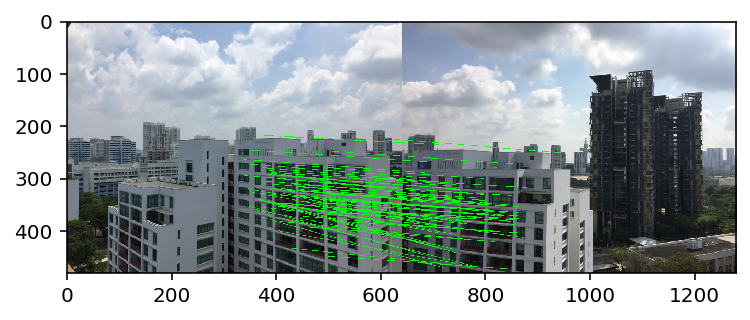

In [39]:
img1 = cv2.imread('im01.jpg')
img2 = cv2.imread('im02.jpg')
# prepare a new canvas
imgSizeY1 = img1.shape[0]
imgSizeX1 = img1.shape[1]
imgSizeY2 = img2.shape[0]
imgSizeX2 = img2.shape[1]
newImg = np.zeros((max(imgSizeY1, imgSizeY2), (imgSizeX1 + imgSizeX2), 3), dtype="uint8")

# paste the two images on the new canvas
newImg[0:imgSizeY1, 0:imgSizeX1] = img1
newImg[0:imgSizeY2, imgSizeX1:] = img2

# get the maximum set of inliners and best homography(superH) on all the inliners from ransac()
maxInliners, superH = ransac()
print("superH:")
print(superH)
length = len(maxInliners)

# draw the matching graph:
i=0
while(i < (length)):
    pt1 = (int(maxInliners[i][0][0]), int(maxInliners[i][0][1]))
    pt2 = ((int(maxInliners[i][1][0]) + imgSizeX1), int(maxInliners[i][1][1]))
    cv2.line(newImg, pt1, pt2, (0, 255, 0), 1)
    i+=1
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.imshow(cv2.cvtColor(newImg,cv2.COLOR_BGR2RGB), interpolation='none')
plt.show()

[[-2.07599822e-03  4.91340074e-05  6.86147940e-01]
 [-1.54968458e-03 -1.49391684e-03  7.27455072e-01]
 [-5.20527639e-06 -5.84555001e-08  1.08493588e-03]]


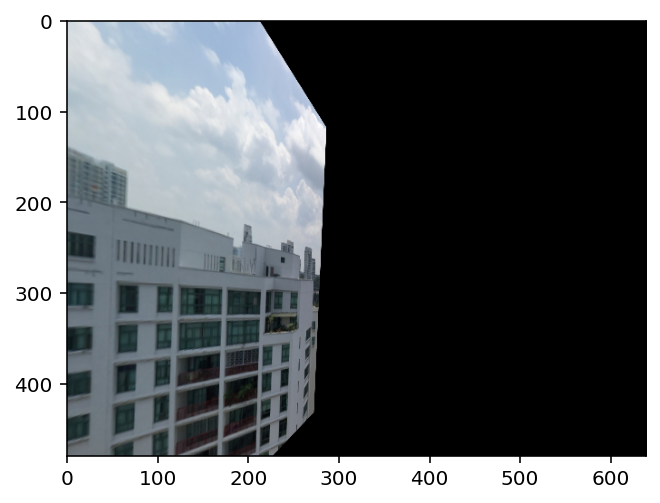

In [40]:
img1 = cv2.imread('im01.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('im02.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# newImg = cv2.warpPerspective(img2, superH, (img1.shape[0]*3,img1.shape[1]*3))
print(superH)
newImg = cv2.warpPerspective(img1, superH, (img1.shape[1],img1.shape[0]))
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.imshow(newImg/255)
plt.show()

In [27]:
alpha = 0.5
img3 = np.uint8(img2*alpha + newImg*(1-alpha))
cv2.imshow('Result2', img3)

[[ 3.45966187e+02  2.70910797e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.75049211e+04 -1.37073284e+04
  -5.05972023e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.45966187e+02
   2.70910797e+02  1.00000000e+00 -1.21966289e+05 -9.55063987e+04
  -3.52538177e+02]
 [ 4.07793884e+02  3.81142822e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -5.01124959e+04 -4.68374315e+04
  -1.22886826e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.07793884e+02
   3.81142822e+02  1.00000000e+00 -1.69356658e+05 -1.58288481e+05
  -4.15299652e+02]
 [ 5.15520081e+02  2.94219910e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00 -1.22396861e+05 -6.98548801e+04
  -2.37424042e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  5.15520081e+02
   2.94219910e+02  1.00000000e+00 -1.63523841e+05 -9.33270528e+04
  -3.17201691e+02]
 [ 3.45966187e+02  2.70910797e+02  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.0000000

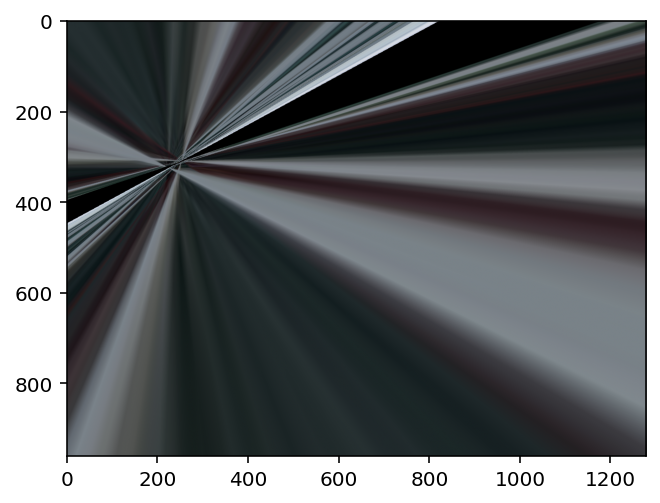

In [28]:
img1 = cv2.imread('im01.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('im02.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# newImg = cv2.warpPerspective(img2, superH, (img1.shape[0]*3,img1.shape[1]*3))
superH1 = getHomographyOfRandomSize(maxInliners)
print(superH1)
newImg = cv2.warpPerspective(img1, superH1, (img1.shape[1]*2,img1.shape[0]*2))
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.imshow(newImg/255)
plt.show()

In [29]:
testH, mask = cv2.findHomography(newMat[:, 0:2], newMat[:, 2:4], cv2.RANSAC,ransacReprojThreshold = 50)
print(testH)
print(mask)

[[-5.86765080e+00 -1.17249153e-01  1.90537519e+03]
 [-2.42206390e+00 -5.90308930e+00  1.43083714e+03]
 [-9.17776902e-03 -3.90607950e-03  1.00000000e+00]]
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [0]
 [0]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [0]
 [1]
 [0]
 [1]
 [0]
 [0]
 [0]
 [1]
 [1]
 [0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [0]
 [1]
 [0]
 [0]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]]


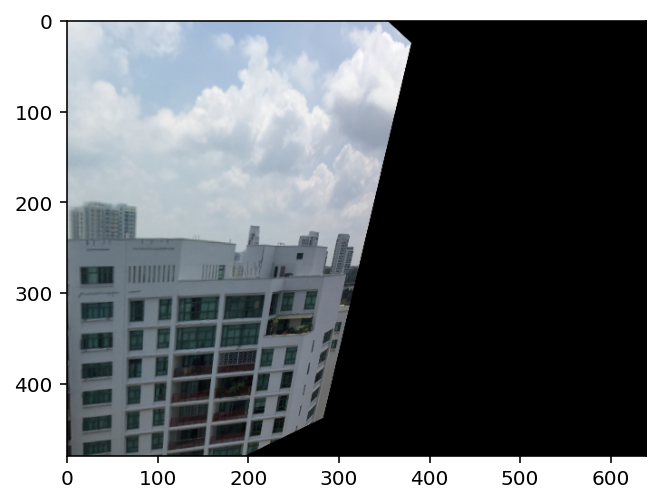

In [30]:
img1 = cv2.imread('im01.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('im02.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# newImg = cv2.warpPerspective(img2, superH, (img1.shape[0]*3,img1.shape[1]*3))
newImg = cv2.warpPerspective(img1, testH, (img1.shape[1],img1.shape[0]))
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.imshow(newImg/255)
plt.show()

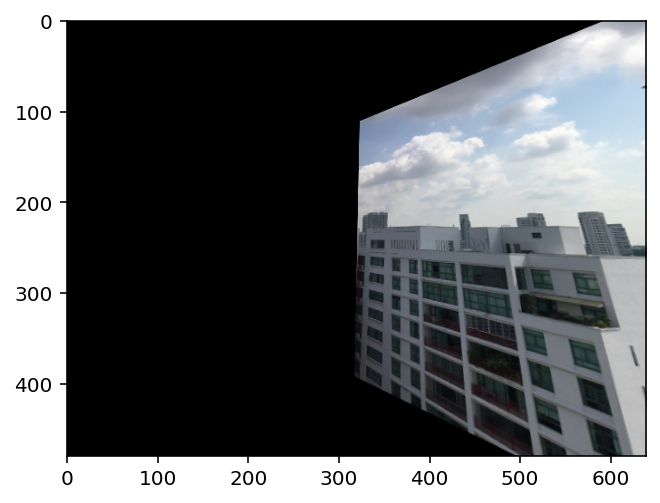

In [31]:
img1 = cv2.imread('im01.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('im02.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# newImg = cv2.warpPerspective(img2, superH, (img1.shape[0]*3,img1.shape[1]*3))
newImg = cv2.warpPerspective(img2, np.linalg.pinv(testH), (img2.shape[1],img2.shape[0]))
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.imshow(newImg/255)
plt.show()

In [32]:
# def getMinMax(array):
#     print("getMinMax:")
#     print(array[0,:])
#     print("getMinMaxEnd")
#     minX = np.min(array[0,:])
#     minY = np.min(array[1,:])
#     maxX = np.max(array[0,:])
#     maxY = np.max(array[1,:])
#     return minX, minY, maxX, maxY

In [33]:
# img1 = cv2.imread('im01.jpg')
# img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
# img2 = cv2.imread('im02.jpg')
# img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# # superH = ransac()
# print(superH)

# computeHomographyAndConcat1(img2, img1, superH)

In [34]:
# img1 = cv2.imread('im01.jpg')
# img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
# img2 = cv2.imread('im02.jpg')
# img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# # superH = ransac()
# print(superH)

# computeHomographyAndConcat(img2, img1, superH)

In [35]:
# def computeHomographyAndConcat(img1, img2, H):
#     imgSizeX1 = img1.shape[0]
#     imgSizeY1 = img1.shape[1]
#     imgSizeX2 = img2.shape[0]
#     imgSizeY2 = img2.shape[1]
    
#     # read the chosen points:
# #     chosenPts1, chosenPts2 = choosePoints(img1, img2)
    
# #     H = getHomography(chosenPts1[0], chosenPts1[1], chosenPts1[2], chosenPts1[3],
# #                       chosenPts2[0], chosenPts2[1], chosenPts2[2], chosenPts2[3])
#     HInverse = np.linalg.pinv(H)
    
#     # get the orgPoses as an array of size 3*imgSize not an img:
#     arrOrgPos = np.zeros((3,imgSizeX1*imgSizeY1))
#     cnt = 0
#     for i in range(0, imgSizeX1):
#         for j in range(0, imgSizeX1):
#             arrOrgPos[:,cnt] = HInverse.dot(np.array([i,j,1]))
#             arrOrgPos[:,cnt] = arrOrgPos[:,cnt]/arrOrgPos[2,cnt]
#             arrOrgPos[0,cnt] = int(arrOrgPos[0,cnt])
#             arrOrgPos[1,cnt] = int(arrOrgPos[1,cnt])
# #             print(arrOrgPos[0,cnt],arrOrgPos[1,cnt],arrOrgPos[2,cnt])
#             cnt+=1
#     # get the minimum and maximum poses of the orgPoses
#     minX, minY, maxX, maxY = getMinMax(arrOrgPos)
#     print(minX, minY, maxX, maxY)
#     # shifting img1, shifting the maximum size of the canvas
#     shiftX = 0
#     shiftY = 0
#     if minX < 0:
#         arrOrgPos[0,:] += abs(minX)
#         shiftX = int(abs(minX))
#         maxX += abs(minX)
#     if minY < 0:
#         arrOrgPos[1,:] += abs(minY)
#         shiftY = int(abs(minY))
#         maxY += abs(minY)
#     # get the new canvas
#     newSizeX = int(maxX)+imgSizeX2
#     newSizeY = int(maxY)+imgSizeY2
#     newImg = np.zeros((newSizeX, newSizeY, 3),np.uint8)
#     # prepare img2 on the new canvas
#     for i in range(0,int(imgSizeX2)):
#         for j in range(0,int(imgSizeY2)):
#             newImg[i+shiftX][j+shiftY] = img2[i][j]   
    
#     for i in range(0, newSizeY):
#         for j in range(0, newSizeX):
#             newPos = np.array([i, j, 1])
#             orgPos = HInverse.dot(newPos) # find the corresponding indexes in the original image by H^(-1)
#             orgPos = orgPos/orgPos[2] # normalize the indexes
#             orgPosX = int(orgPos[0]) # round the indexes to integer
#             orgPosY = int(orgPos[1]) 
#             if((orgPosX >= 0 and orgPosX < imgSizeY1) and (orgPosY >= 0 and orgPosY < imgSizeX1)):
#                 if(j+shiftX < newSizeX and i+shiftY < newSizeY):
#                     newImg[j+shiftX][i+shiftY] = img1[orgPosY][orgPosX]       
                
#     # Draw img
#     %matplotlib inline
#     %config InlineBackend.figure_format = 'retina'
#     plt.imshow(newImg/255)
#     plt.show()